<a href="https://colab.research.google.com/github/Tejas-Chaudhari-007/EE-769-Introduction-to-Machine-Learning/blob/main/Assignments/Assignment_1_Q_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Assignment details

Assignment number: 1 (Q.1)

Course: EE 769 (Introduction to Machine Learning)

Instructor: [Prof. Amit Sethi](https://www.ee.iitb.ac.in/~asethi/)

Student name: Tejas Chaudhari

Student roll number: 10D110017


# Assignment questions
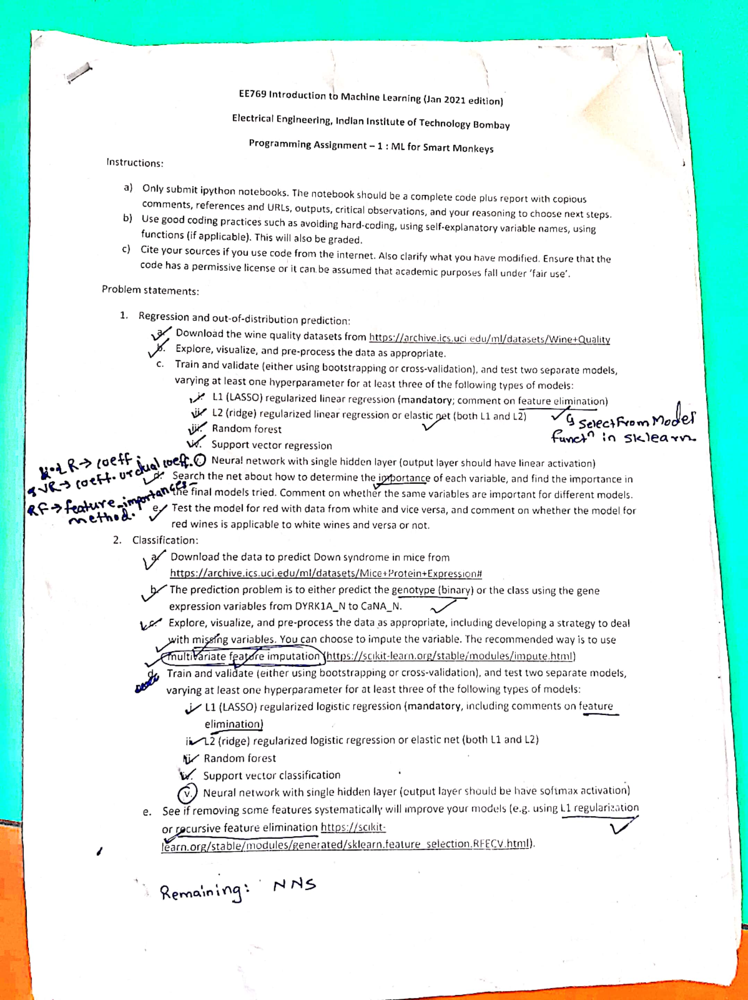

Useful tips:

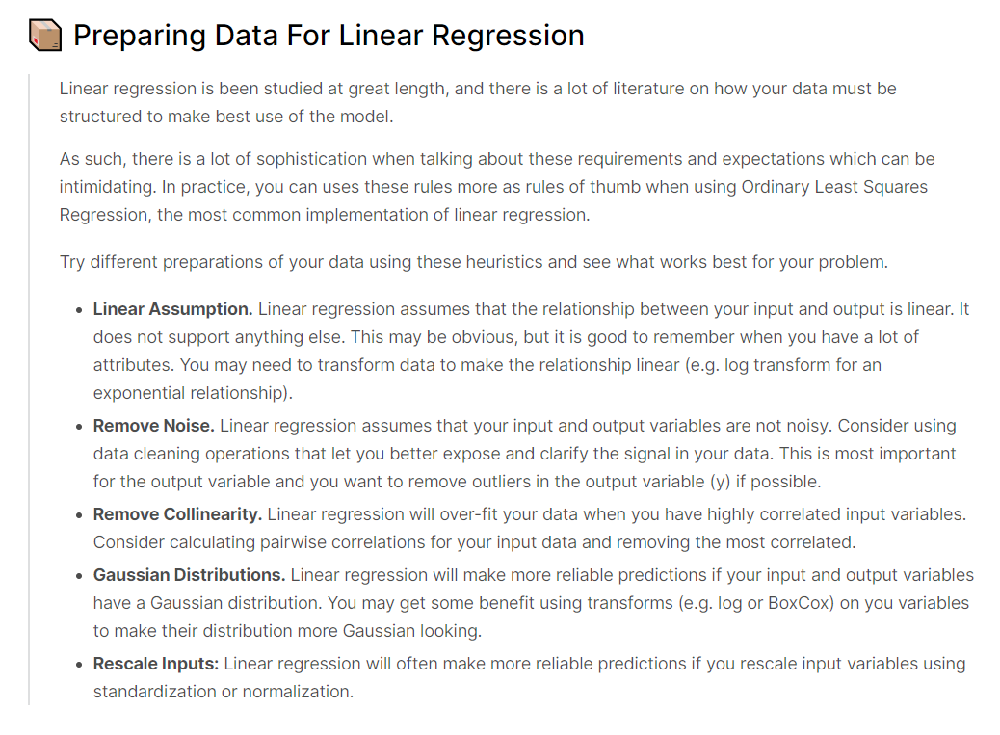

Source:https://www.kaggle.com/faressayah/linear-regression-house-price-prediction

# Import packages

In [ ]:
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

## Suppress warnings 
# import warnings
# warnings.filterwarnings('ignore')

# Data split function
from sklearn.model_selection import train_test_split


# a) Upload data files    

In [ ]:
from google.colab import files  # Colab-specific library to load files

# Upload both train and test files
uploaded_files = files.upload()  # Its a dictionary with file names as keys 

# Print name and size of uploaded files for confirmation
for file_name in uploaded_files.keys():
  file_size = len(uploaded_files[file_name])
  print(f'You have uploaded file {file_name} with {round(file_size/10**6, 3)} MB')

Saving winequality-red.csv to winequality-red.csv
Saving winequality-white.csv to winequality-white.csv
You have uploaded file winequality-red.csv with 0.084 MB
You have uploaded file winequality-white.csv with 0.264 MB


## Data Source:
Paulo Cortez, University of Minho, Guimarães, Portugal, http://www3.dsi.uminho.pt/pcortez
A. Cerdeira, F. Almeida, T. Matos and J. Reis, Viticulture Commission of the Vinho Verde Region(CVRVV), Porto, Portugal
@2009



## Data Set Information
The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine. For more details, consult: [Web Link] or the reference [Cortez et al., 2009]. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

These datasets can be viewed as classification or regression tasks. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.

## Attribute information:
For more information, read [Cortez et al., 2009].
Input variables (based on physicochemical tests):
1 - fixed acidity
2 - volatile acidity
3 - citric acid
4 - residual sugar
5 - chlorides
6 - free sulfur dioxide
7 - total sulfur dioxide
8 - density
9 - pH
10 - sulphates
11 - alcohol
Output variable (based on sensory data):
12 - quality (score between 0 and 10)

## Database citation
P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis.
Modeling wine preferences by data mining from physicochemical properties. In Decision Support Systems, Elsevier, 47(4):547-553, 2009.



# b) Preliminary data processing 

## Read data

In [ ]:
# Data manipulations libraries
import pandas as pd
import numpy as np

# Read the data as pandas dataframe
as_read_data_df = pd.read_excel('') 
# Note that the file is of 'xls' format so '.read_excel' was used
display(as_read_data_df)


'Red wine data: '

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


---------------------------------------------------------------------------------------------------- 



'White wine data: '

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


Obervations:
1. Red wine data: 1599 total data rows and 12 features.
2. White wine data: 4898 data samples and 12 features.

## Check data types 
1. Object(str) data type - categorical variable
2. float or int data type - numerical variable (can be discrete or continuous depending on number of unique values based on situtation)

In [ ]:
# Check data types
print('Red wine data types: \n', red_wine_data_df.dtypes)
print('--'*50, '\n')
print('White wine data types: \n', white_wine_data_df.dtypes)

Red wine data types: 
 fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object
---------------------------------------------------------------------------------------------------- 

White wine data types: 
 fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object


In [ ]:
# Get data type counts
print('Red wine data type counts: \n', red_wine_data_df.dtypes.value_counts())
print('--'*50, '\n')
print('White wnie data type counts: \n', white_wine_data_df.dtypes.value_counts())

Red wine data type counts: 
 float64    11
int64       1
dtype: int64
---------------------------------------------------------------------------------------------------- 

White wnie data type counts: 
 float64    11
int64       1
dtype: int64


Observations:
1. All the input features are numerical (no encoding required)
2. Output is numerical too.

## Check unique values
1. High number of unique values - contious variable
2. Low number of unique values - discrete variable

In [ ]:
# Check number of unique values in each column
print('Red wine unique values counts: \n', red_wine_data_df.nunique())
print('--'*50, '\n')
print('White wine unique values counts: \n', white_wine_data_df.nunique())

Red wine unique values counts: 
 fixed acidity            96
volatile acidity        143
citric acid              80
residual sugar           91
chlorides               153
free sulfur dioxide      60
total sulfur dioxide    144
density                 436
pH                       89
sulphates                96
alcohol                  65
quality                   6
dtype: int64
---------------------------------------------------------------------------------------------------- 

White wine unique values counts: 
 fixed acidity            68
volatile acidity        125
citric acid              87
residual sugar          310
chlorides               160
free sulfur dioxide     132
total sulfur dioxide    251
density                 890
pH                      103
sulphates                79
alcohol                 103
quality                   7
dtype: int64


Observations:
1. All of the input variables have more than 10 (sufficient) number of unique values for them to consider as continuous.
2. Output variable has only 6 and 7 unique values it can be considered as categorical or numerical depending on the situtation.

In [ ]:
# Show unique values in target column quality
print('Red wine target unique values: \n', red_wine_data_df['quality'].unique())
print('--'*50, '\n')
print('White wine target unique values: \n', white_wine_data_df['quality'].unique())

Red wine target unique values: 
 [5 6 7 4 8 3]
---------------------------------------------------------------------------------------------------- 

White wine target unique values: 
 [6 5 7 8 4 3 9]


## Check missing values

In [ ]:
# Check if there are any missing values in the data
print('Red wine data missing values: \n', red_wine_data_df.isna().sum())
print('--'*50, '\n')
print('White wine data missing values: \n', white_wine_data_df.isna().sum())

Red wine data missing values: 
 fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64
---------------------------------------------------------------------------------------------------- 

White wine data missing values: 
 fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


Observations:
1. No missing values in the data

Note:
1. Filling missing values is known as 'imputation'

In [ ]:
# Combined command
print('Red wine data info: \n', red_wine_data_df.info())
print('--'*50, '\n')
print('White wine data info: \n', white_wine_data_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB
Red wine data info: 
 None
---------------------------------------------------------------------------------------------------

# EDA

## Distribution of the target column

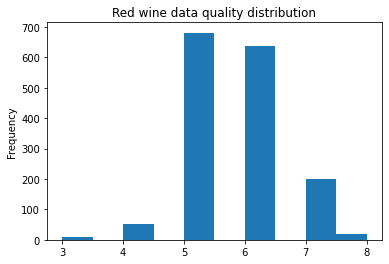

---------------------------------------------------------------------------------------------------- 



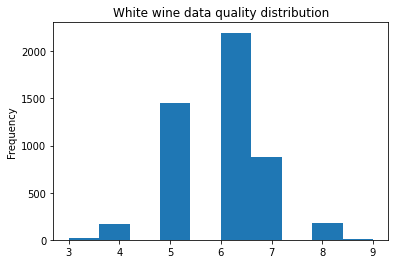

In [ ]:
# Plot the target column histogram
red_wine_data_df['quality'].plot(kind='hist', title='Red wine data quality distribution')
plt.show()
print('--'*50, '\n')
white_wine_data_df['quality'].plot(kind='hist', title='White wine data quality distribution')

Observation:
1. Target classes are imbalanced. Normal scores are more frequent than the extremene ones.
2. In ML modelling we need to weigh classes to reflect this imbalance.

### KDE plots of distributions of input columns on classes of target
Used to check which columns are indicative/predictive of classes in the target

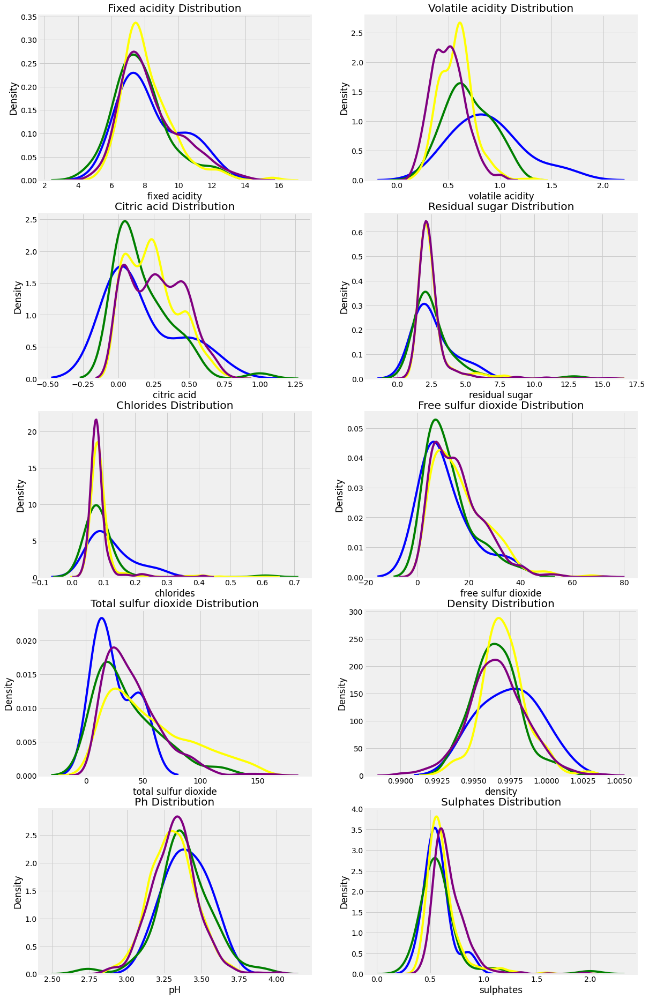

In [ ]:
# Source: https://www.kaggle.com/willkoehrsen/a-complete-introduction-and-walkthrough

# For red wine data
from collections import OrderedDict

plt.figure(figsize = (20, 16))
plt.style.use('fivethirtyeight')

# Color mapping
colors = OrderedDict({1: 'red', 2: 'orange', 3: 'blue', 4: 'green', 5:'yellow', 6:'purple'})
quality_mapping = OrderedDict({1: 'score=3', 2: 'score=4', 3: 'score=5', 4: 'score=6', 5:'score=7', 6:'score=8', 7:'Score=9'})

# Iterate through the float columns
for i, col in enumerate(red_wine_data_df.columns[0:-2]): # -2 ignores target column 'quality'
    ax = plt.subplot(6, 2, i + 1)  # Set number of rows and columns in figures
    # Iterate through the quality levels
    for quality_level, color in colors.items():
        # Plot each quality level as a separate line
        sns.kdeplot(red_wine_data_df.loc[red_wine_data_df['quality'] == quality_level, col], 
                    ax = ax, color = color, label = quality_mapping[quality_level])
        
    plt.title(f'{col.capitalize()} Distribution'); plt.xlabel(f'{col}'); plt.ylabel('Density')

plt.subplots_adjust(top = 2)

Observations:
1. Variables: 'Fixed acidity', 'Residual sugar', 'Chlorides' do not look predictive of the classes in the classification problem.
2. All other variables show some difference in the distributions over the classes hence would be likely to be predictive of the classes.

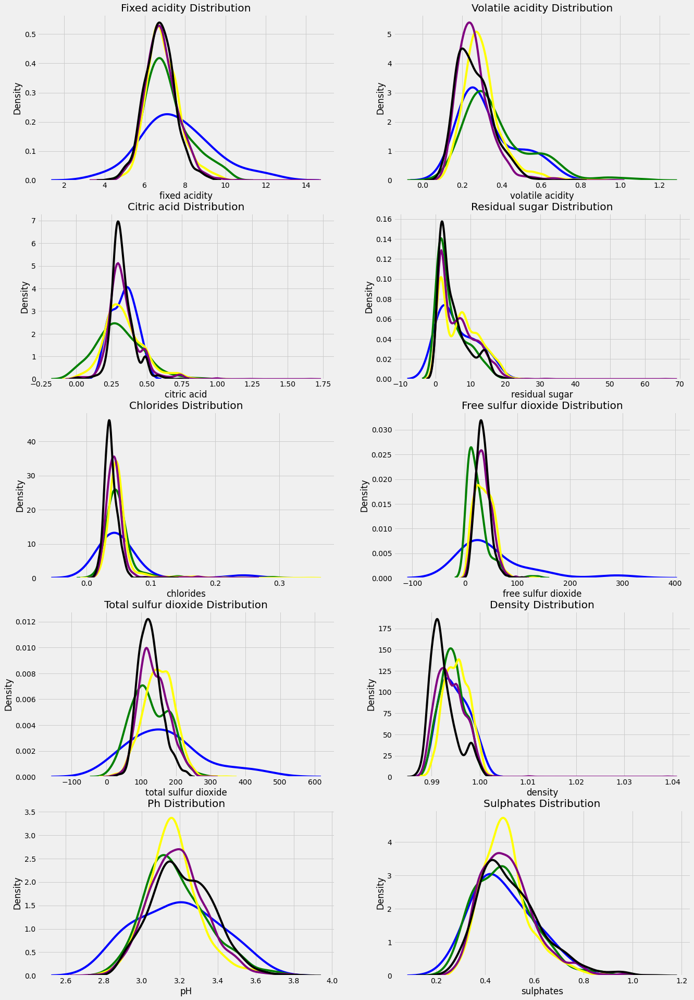

In [ ]:
# Source: https://www.kaggle.com/willkoehrsen/a-complete-introduction-and-walkthrough

# For white wine data
from collections import OrderedDict

plt.figure(figsize = (20, 16))
plt.style.use('fivethirtyeight')

# Color mapping
colors = OrderedDict({1: 'red', 2: 'orange', 3: 'blue', 4: 'green', 5:'yellow', 6:'purple', 7:'black'})
quality_mapping = OrderedDict({1: 'score=3', 2: 'score=4', 3: 'score=5', 4: 'score=6', 5:'score=7', 6:'score=8', 7:'score=9'})

# Iterate through the float columns
for i, col in enumerate(white_wine_data_df.columns[0:-2]): # -2 ignores target column 'quality'
    ax = plt.subplot(6, 2, i + 1)  # Set number of rows and columns in figures
    # Iterate through the quality levels
    for quality_level, color in colors.items():
        # Plot each quality level as a separate line
        sns.kdeplot(white_wine_data_df.loc[white_wine_data_df['quality'] == quality_level, col], 
                    ax = ax, color = color, label = quality_mapping[quality_level])
        
    plt.title(f'{col.capitalize()} Distribution'); plt.xlabel(f'{col}'); plt.ylabel('Density')

plt.subplots_adjust(top = 2)

## Numerical descriptive statistics


In [ ]:
display('Red wine data descriptive statistics: ', red_wine_data_df.describe())
display('White wine data descriptive statistics: ', white_wine_data_df.describe())

'Red wine data descriptive statistics: '

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


'White wine data descriptive statistics: '

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000,4898.000000
mean,6.854788,0.278241,0.334192,6.391415,0.045772,35.308085,138.360657,0.994027,3.188267,0.489847,10.514267,5.877909
std,0.843868,0.100795,0.121020,5.072058,0.021848,17.007137,42.498065,0.002991,0.151001,0.114126,1.230621,0.885639
min,3.800000,0.080000,0.000000,0.600000,0.009000,2.000000,9.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.300000,0.210000,0.270000,1.700000,0.036000,23.000000,108.000000,0.991723,3.090000,0.410000,9.500000,5.000000
50%,6.800000,0.260000,0.320000,5.200000,0.043000,34.000000,134.000000,0.993740,3.180000,0.470000,10.400000,6.000000
75%,7.300000,0.320000,0.390000,9.900000,0.050000,46.000000,167.000000,0.996100,3.280000,0.550000,11.400000,6.000000
max,14.200000,1.100000,1.660000,65.800000,0.346000,289.000000,440.000000,1.038980,3.820000,1.080000,14.200000,9.000000


## Scatter matrix

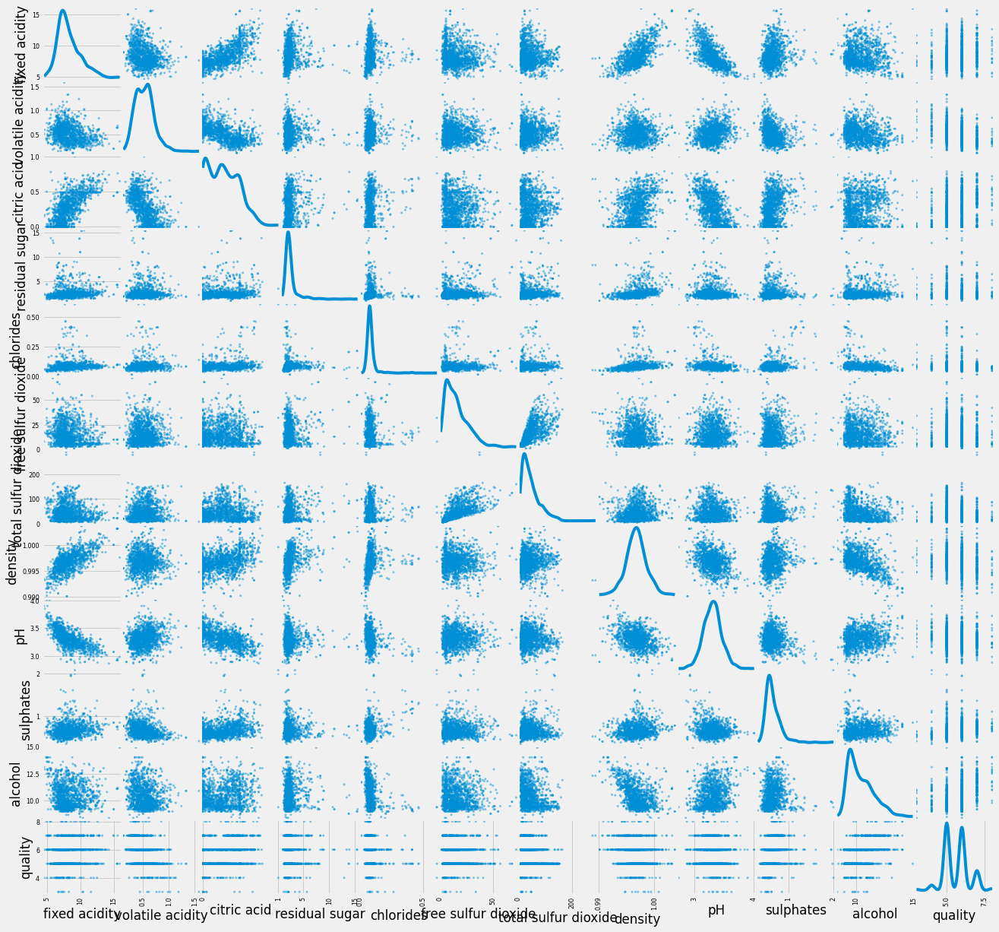

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f423e756410>,
      dtype=object)

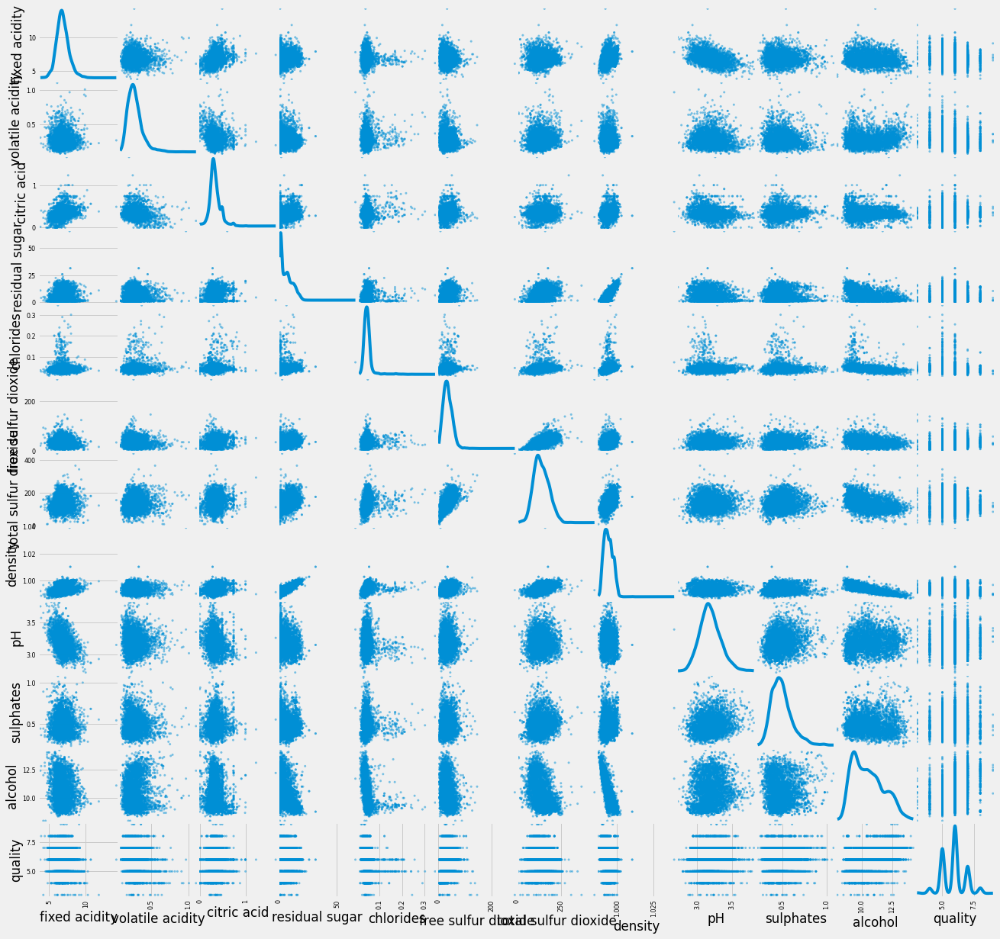

In [ ]:
# Plot scatter matrix
pd.plotting.scatter_matrix(red_wine_data_df, diagonal='kde', figsize=(20,20))
plt.show()
print('\n')
pd.plotting.scatter_matrix(white_wine_data_df, diagonal='kde', figsize=(20,20))


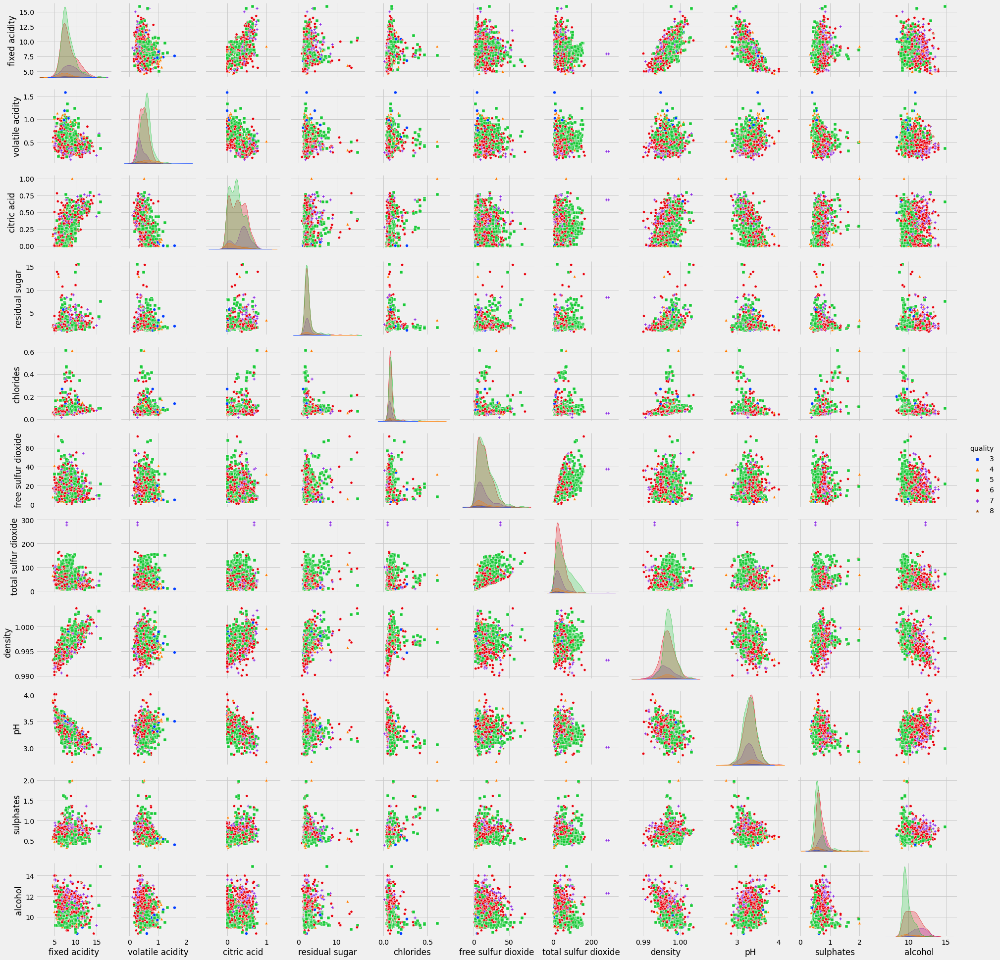

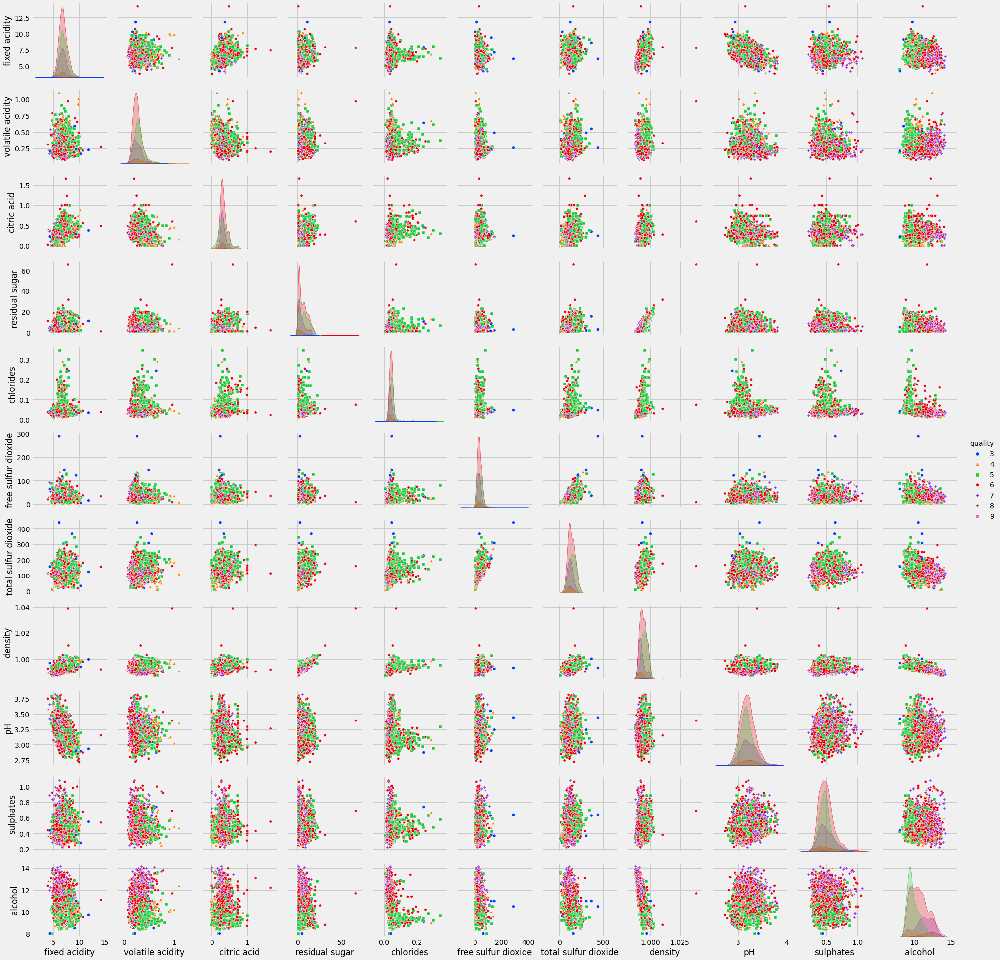

In [ ]:
# Using seaborn
# Source - https://seaborn.pydata.org/generated/seaborn.pairplot.html

## Quick way
# sns.pairplot(data_df)

sns.pairplot(red_wine_data_df, hue='quality', hue_order=[3,4,5,6,7,8], markers=["o", "^", "s", "p", "P", "*"], palette=sns.color_palette(palette="bright", n_colors=6), diag_kind='kde')
sns.pairplot(white_wine_data_df, hue='quality', hue_order=[3,4,5,6,7,8,9], markers=["o", "^", "s", "p", "P", "*", "X"], palette=sns.color_palette(palette="bright", n_colors=7), diag_kind='kde')

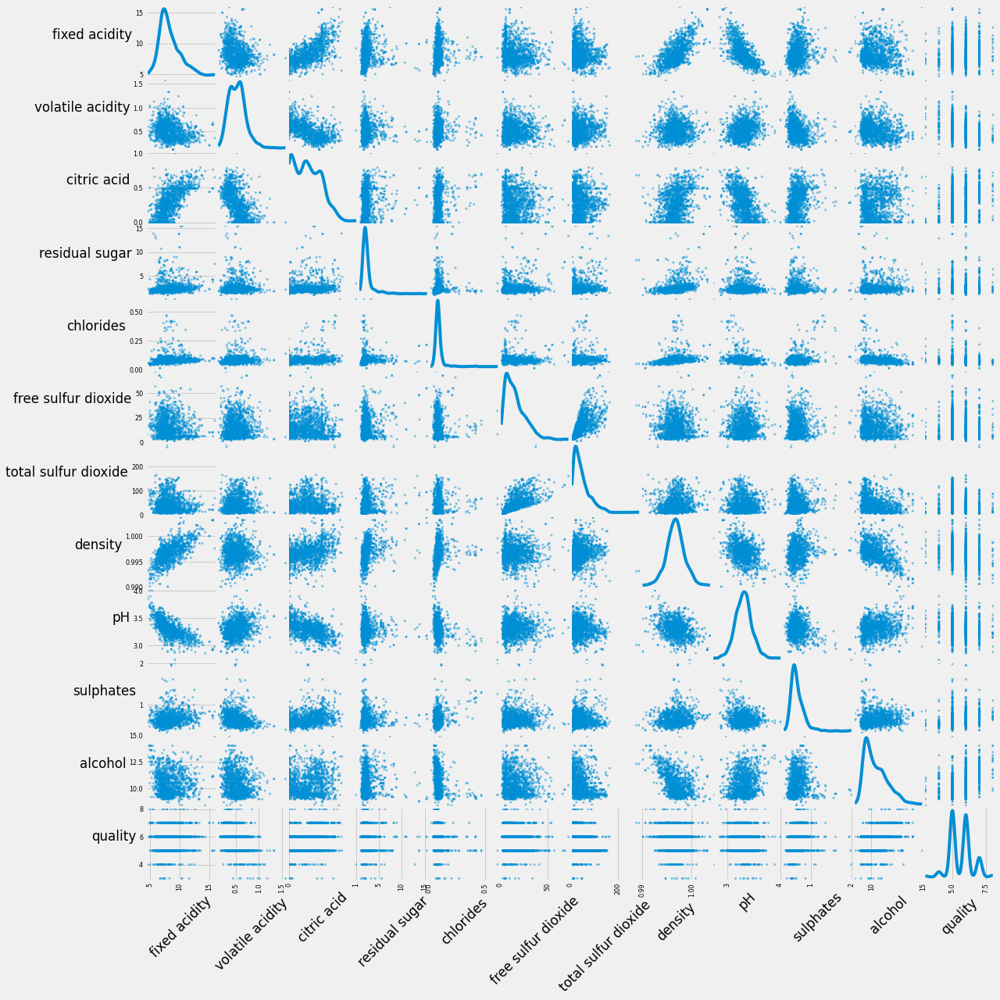

In [ ]:
# Aligning the plot properly (Red wine data)
# Source - https://stackoverflow.com/questions/58623528/pandas-scatter-matrix-labels-vertical-x-and-horizontal-y-without-being-cut
# Modification - changes x axis rotation to 45

# Set plots
axes = pd.plotting.scatter_matrix(red_wine_data_df, diagonal='kde', figsize=(18,18))

# Set axes
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(45)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

# Plot
plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

Observations:
1. All the input variables look continuous variables
2. Target variable is discrete.
3. There seems to be no strong correlation. Lets check correlation heatmap.

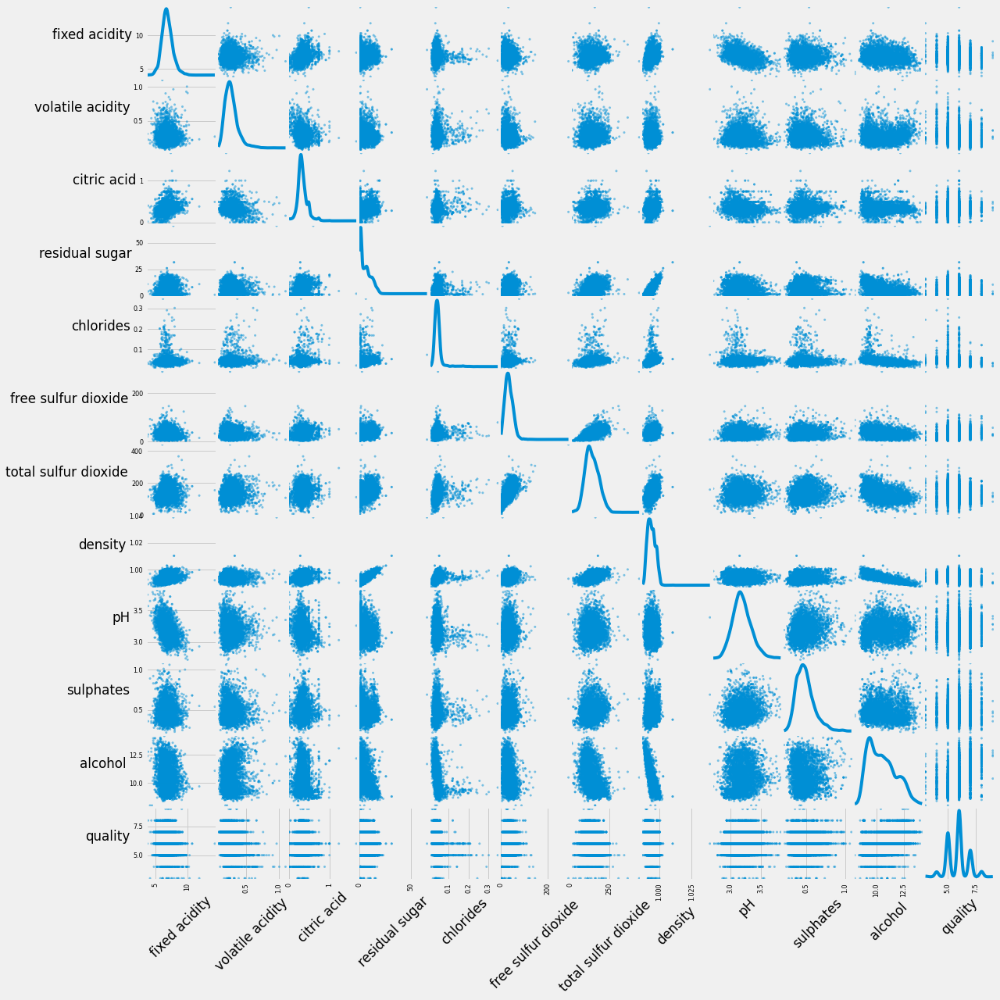

In [ ]:
# Aligning the plot properly (White wine data)
# Source - https://stackoverflow.com/questions/58623528/pandas-scatter-matrix-labels-vertical-x-and-horizontal-y-without-being-cut
# Modification - changes x axis rotation to 45

# Set plots
axes = pd.plotting.scatter_matrix(white_wine_data_df, diagonal='kde', figsize=(18,18))

# Set axes
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(45)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

# Plot
plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

## Correlation heatmap

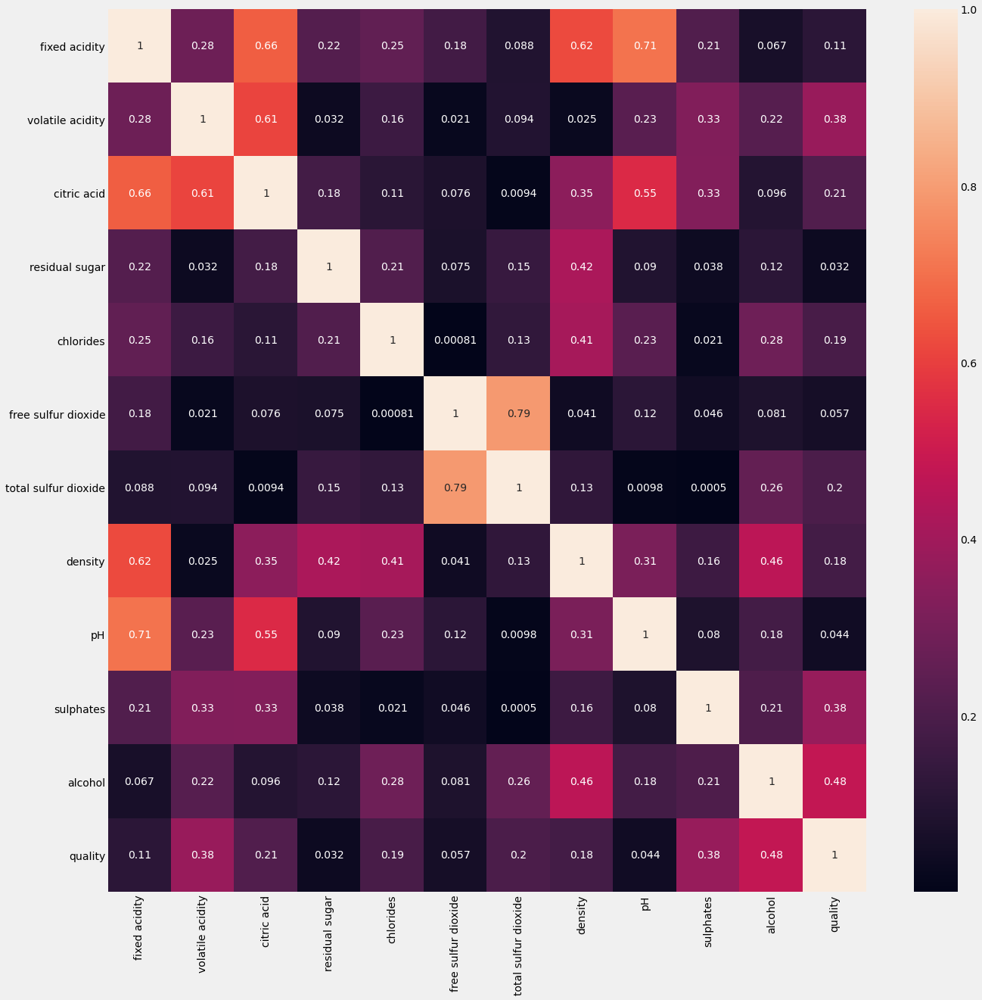

In [ ]:
# Red wine data
# Source - (EE 769 - ML for smart monkeys) https://www.youtube.com/watch?v=Ato-hcv0NK0&list=PLZKhx5nBXhfhL28m4mjIM5kSwh5gUV2k6&index=3
# Calculate correlation matrix
correlation_matrix = red_wine_data_df.corr(method='spearman')  # Use spearman for non-linear/monotonicity

# Plot absolute correlation matrix heatmap
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(abs(correlation_matrix), annot=True) # Show absolute value
plt.show()

Observations:
1. There seems to be no very strong correlation between any 2 variables.
2. Highest correlation oberved is 0.79

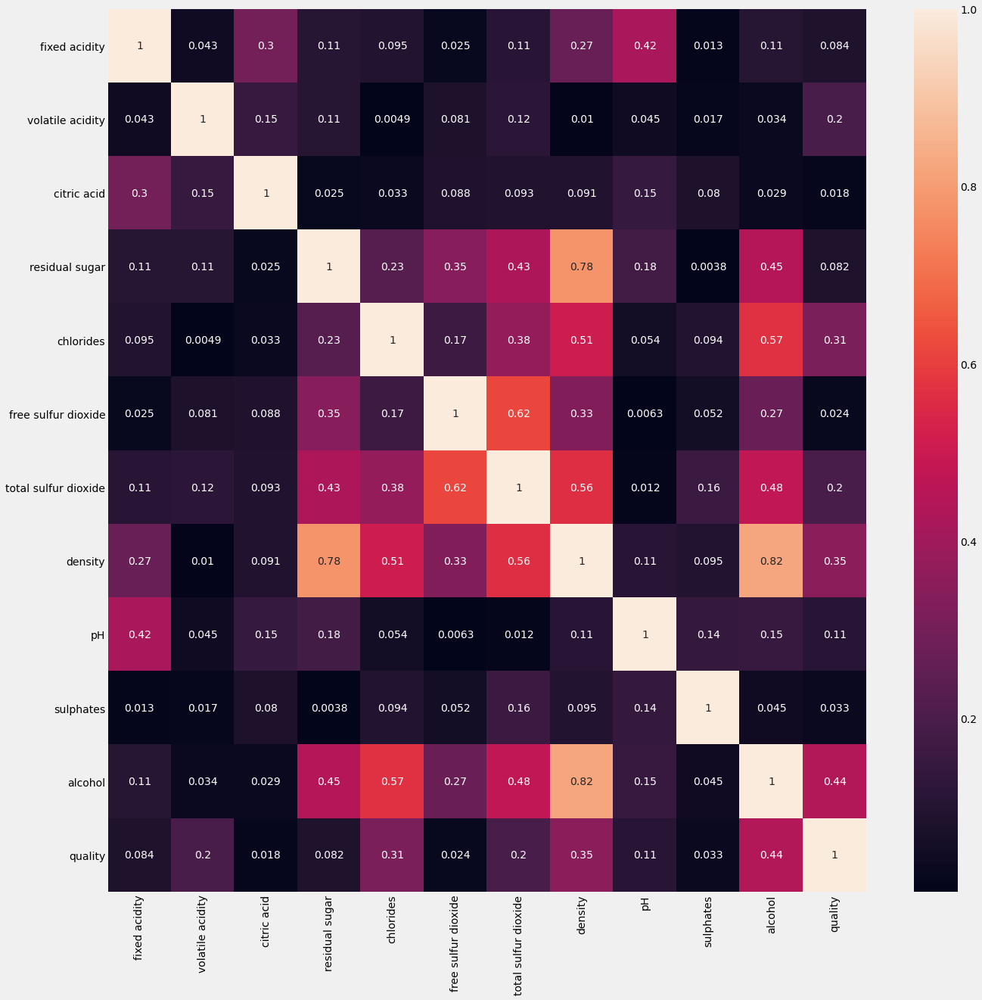

In [ ]:
# White wine data
# Source - (EE 769 - ML for smart monkeys) https://www.youtube.com/watch?v=Ato-hcv0NK0&list=PLZKhx5nBXhfhL28m4mjIM5kSwh5gUV2k6&index=3
# Calculate correlation matrix
correlation_matrix = white_wine_data_df.corr(method='spearman')  # Use spearman for non-linear/monotonicity

# Plot absolute correlation matrix heatmap
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(abs(correlation_matrix), annot=True) # Show absolute value
plt.show()

Observations:
1. High correlations: 'density' and 'alcohol', 'residual sugar' and 'density'

## Box plots on target
1.  If the spread of the variable is similar for all classes then it is not predictive of the class

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

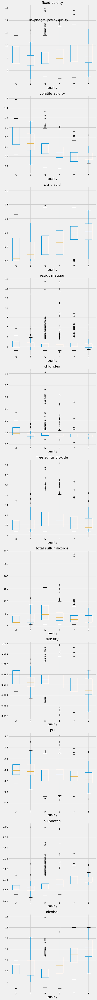

In [ ]:
# Red wine data
# Source - (EE 769 - ML for smart monkeys) https://www.youtube.com/watch?v=Ato-hcv0NK0&list=PLZKhx5nBXhfhL28m4mjIM5kSwh5gUV2k6&index=3
# Plot boxplots for both classes corresponding to each column
figure, axes_array = plt.subplots(nrows=len(red_wine_data_df.columns.values[0:-1]), ncols=1, figsize=(8,80))
for i, column_name in enumerate(red_wine_data_df.columns.values[0:-1]): # Skip target column (last
    red_wine_data_df.boxplot(ax=axes_array[i], by='quality', column=column_name, grid=True)
plt.tight_layout() # Avoids overlapping of x-labels and plot tittles

Observations:
1. No feature has same spread for all classes.
2. So it looks like all features all predictive of the classes.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de

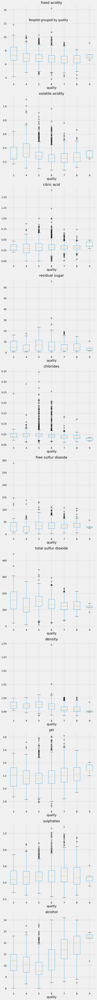

In [ ]:
# white wine data
# Source - (EE 769 - ML for smart monkeys) https://www.youtube.com/watch?v=Ato-hcv0NK0&list=PLZKhx5nBXhfhL28m4mjIM5kSwh5gUV2k6&index=3
# Plot boxplots for both classes corresponding to each column
figure, axes_array = plt.subplots(nrows=len(white_wine_data_df.columns.values[0:-1]), ncols=1, figsize=(8,80))
for i, column_name in enumerate(white_wine_data_df.columns.values[0:-1]): # Skip target column (last
    white_wine_data_df.boxplot(ax=axes_array[i], by='quality', column=column_name, grid=True)
plt.tight_layout() # Avoids overlapping of x-labels and plot tittles

# ML modelling

## Standardize the data


In [ ]:
# Red wine data
# Separate input and output data using iloc (# iloc[row slicing, column slicing])
red_wine_X_data = red_wine_data_df.iloc[:,0:-1]  # All columns except the last one ('quality) 
red_wine_y_data = red_wine_data_df.iloc[:,-1] # 'quallity' column

In [ ]:
# White wine data
# Separate input and output data using iloc (# iloc[row slicing, column slicing])
white_wine_X_data = white_wine_data_df.iloc[:,0:-1]  # All columns except the last one ('quality) 
white_wine_y_data = white_wine_data_df.iloc[:,-1] # 'quallity' column

In [ ]:
# Import standardization function 
from sklearn.preprocessing import StandardScaler

# Standardize all the input variables in the data (train+test)
red_wine_scaled_X_data = pd.DataFrame(StandardScaler().fit_transform(red_wine_X_data), columns=red_wine_X_data.columns)  # Defined as pd.DataFrame as StandardScaler transform changes input to numpy array.
# Note: retaining column names is useful for feature importance later on

# Confirm the standardization
display(red_wine_scaled_X_data.head(5))
red_wine_scaled_X_data.agg(['mean', 'std'])

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246
1,-0.298547,1.967442,-1.391472,0.043416,0.223875,0.872638,0.624363,0.028261,-0.719933,0.128950,-0.584777
2,-0.298547,1.297065,-1.186070,-0.169427,0.096353,-0.083669,0.229047,0.134264,-0.331177,-0.048089,-0.584777
3,1.654856,-1.384443,1.484154,-0.453218,-0.264960,0.107592,0.411500,0.664277,-0.979104,-0.461180,-0.584777
4,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
mean,3.435512e-16,1.699704e-16,4.335355e-16,-1.905223e-16,4.838739e-16,1.432042e-16,1.289532e-16,2.336509e-14,3.002879e-15,7.639596e-16,9.437243e-16
std,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00,1.000313e+00


In [ ]:
# Import standardization function 
from sklearn.preprocessing import StandardScaler

# Standardize all the input variables in the data (train+test)
white_wine_scaled_X_data = pd.DataFrame(StandardScaler().fit_transform(white_wine_X_data), columns=white_wine_X_data.columns)  # Defined as pd.DataFrame as StandardScaler transform changes input to numpy array.
# Note: retaining column names is useful for feature importance later on

# Confirm the standardization
display(white_wine_scaled_X_data.head(5))
white_wine_scaled_X_data.agg(['mean', 'std'])

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.172097,-0.081770,0.213280,2.821349,-0.035355,0.569932,0.744565,2.331512,-1.246921,-0.349184,-1.393152
1,-0.657501,0.215896,0.048001,-0.944765,0.147747,-1.253019,-0.149685,-0.009154,0.740029,0.001342,-0.824276
2,1.475751,0.017452,0.543838,0.100282,0.193523,-0.312141,-0.973336,0.358665,0.475102,-0.436816,-0.336667
3,0.409125,-0.478657,-0.117278,0.415768,0.559727,0.687541,1.121091,0.525855,0.011480,-0.787342,-0.499203
4,0.409125,-0.478657,-0.117278,0.415768,0.559727,0.687541,1.121091,0.525855,0.011480,-0.787342,-0.499203


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
mean,7.584333e-17,5.196832e-16,6.019639e-16,-1.024542e-16,6.482723e-17,-4.671641e-17,1.057636e-16,3.212112e-14,-1.203860e-15,-7.572999e-16,-2.178784e-15
std,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00,1.000102e+00


Observations:
1. As means and standard deviations are almost zero, all of our input data is standardized.
2. Note that in this case we have used same standardization to train and test data. In some cases we might want to standardize both separately.

## Train-val-test data split

Pandas dataframe slicing:
1. loc is primarily label based indexing. Integers may be used but they are interpreted as a label.
2. iloc is primarily integer based indexing (e.g. df.iloc[row slicing, column slicing])

In [ ]:
# Red wine Data split (85-15)
## Split data into 'training+validation' and 'testing'
red_wine_X_train, red_wine_X_test, red_wine_y_train, red_wine_y_test = train_test_split(
    red_wine_scaled_X_data, red_wine_y_data, test_size = 0.15, random_state=35, shuffle=True)

# Display final data splits
display('data shape: ', red_wine_data_df.shape)
display('Input train data shape: ', red_wine_X_train.shape)  # 85 % of the data
display('Output train data shape: ', red_wine_y_train.shape)  # 85 % of the data
display('Input test data shape: ', red_wine_X_test.shape)  # 15 % of the data
display('Output test data shape: ', red_wine_y_test.shape)  # 15 % of the data

display(red_wine_X_train.head(5))  # Note that the column names are retained in the standardization

'data shape: '

(1599, 12)

'Input train data shape: '

(1359, 11)

'Output train data shape: '

(1359,)

'Input test data shape: '

(240, 11)

'Output test data shape: '

(240,)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
788,0.965420,0.179770,-0.159061,-0.240375,-0.179946,0.298854,0.350683,1.247292,-0.849519,-0.579207,-0.303175
667,1.712309,-1.049255,0.919299,-0.382271,-0.116184,-0.944346,-0.956903,1.088288,-2.404546,0.010924,-1.147981
1016,0.333436,-0.825796,0.662546,-0.240375,-0.413736,-0.370562,-0.561586,-0.999966,-0.266384,0.542042,2.043506
1206,-0.643266,-0.937525,0.970649,-0.311323,-0.286214,0.777007,-0.075043,-0.745559,0.575922,1.132173,0.541630
416,1.310138,-0.267148,1.894957,-0.240375,0.500174,-0.944346,-0.804858,0.134264,-0.331177,0.010924,1.198701


In [ ]:
# White wine Data split (85-15)
## Split data into 'training+validation' and 'testing'
white_wine_X_train, white_wine_X_test, white_wine_y_train, white_wine_y_test = train_test_split(
    white_wine_scaled_X_data, white_wine_y_data, test_size = 0.15, random_state=35, shuffle=True)

# Display final data splits
display('data shape: ', white_wine_data_df.shape)
display('Input train data shape: ', white_wine_X_train.shape)  # 85 % of the data
display('Output train data shape: ', white_wine_y_train.shape)  # 85 % of the data
display('Input test data shape: ', white_wine_X_test.shape)  # 15 % of the data
display('Output test data shape: ', white_wine_y_test.shape)  # 15 % of the data

display(white_wine_X_train.head(5))  # Note that the column names are retained in the standardization

'data shape: '

(4898, 12)

'Input train data shape: '

(4163, 11)

'Output train data shape: '

(4163,)

'Input test data shape: '

(735, 11)

'Output test data shape: '

(735,)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
2104,-1.013043,-1.173210,-0.282557,0.060846,-0.126906,0.452322,0.344506,0.358665,2.925674,-0.261553,0.069674
1039,0.764667,-1.073988,0.048001,-0.984201,-0.493110,-1.311824,-0.855671,-0.744792,-0.915763,2.192130,0.394746
1476,0.290611,5.673097,1.287594,0.455204,-0.813539,0.275907,1.074025,0.726484,0.210175,-1.137868,0.150942
4186,0.883181,-0.081770,-0.117278,-1.023637,-0.126906,-0.723775,-1.561658,-0.557539,-0.849531,1.666341,-0.011595
3569,1.357237,-0.280214,-0.530476,0.652383,-0.447335,-1.194214,-1.255730,0.010909,-1.313153,-1.137868,0.557282


## Model Comparison using Gridsearchcv with bootstrapping
Source - https://alfurka.github.io/2018-11-18-grid-search/
1. Modification to the source: in the models dictionary model was fitted to entire data (train and test) using the GridsearchCV. In this code we have removed the fitting part from the dictionary and added it to the function to fit on the training data only.
2. We will define a function which will perform splitting of the data (bootstrapping) and then ML modelling using Gridsearchcv iteratively.
3. This way we would combine both methods: 'bootstrapping' to make our model more generalized over samples and 'gridsearchcv'(best estimator) for testing a range of hyper-paramters 

### Define function for comparing models using Gridsearchcv with boostrapping

In [ ]:
def test_models(models_dict, X_data, y_data, n_iterations, test_size):
    # Import required library functions in this function
    from sklearn import metrics
    from sklearn.model_selection import train_test_split

    # Define a performance metric dictionary to store the results
    performance_metric_dict = {}

    for model_name, model in models_dict.items(): # Loop over models dictionary
        # Create lists to store performance metrics over the samples
        performance_metrics_train_list = []
        performance_metrics_test_list = []

        for iteration_index in range(1, n_iterations + 1, 1):
            # Split the data
            X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=test_size)

            # Fit the data to model
            fitted_model = model.fit(X_train, y_train)

            # Get best estimator model
            try: # Try-except is added since OLS does not have 'best_estimator_' method
                best_estimator_model = fitted_model.best_estimator_ 
            except:
                best_estimator_model = fitted_model

            # Get predictions on train data
            y_train_predict = best_estimator_model.predict(X_train)

            # Get predictions on test data
            y_test_predict = best_estimator_model.predict(X_test)

            # Compute performance metric on training data and append it to the list
            performance_metric_train = metrics.r2_score(y_train, y_train_predict)
            performance_metrics_train_list.append(performance_metric_train)

            # Compute performance metric on testing data and append it to the list
            performance_metric_test = metrics.r2_score(y_test, y_test_predict)
            performance_metrics_test_list.append(performance_metric_test)

        
        # Take the average of performanc metrics over the samples for both train and test
        performance_metric_dict[model_name] = [np.mean(performance_metrics_train_list), np.mean(performance_metrics_test_list)]
    
    # Define results dataframe
    indices_list = ['R-squared on train', 'R-Squared on test']
    results_df = pd.DataFrame.from_dict(performance_metric_dict)

    # Return the results dataframe
    return results_df


### Use the function to test the models

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import GridSearchCV

# Define parameter dictionaries
lasso_hyperparam_dict = {
    'alpha': [0.02, 0.024, 0.025, 0.026, 0.03]
}
ridge_hyperparam_dict = {
    'alpha': [200, 230, 250,265, 270, 275, 290, 300, 500]
}

# Define models dictionary
models_to_test_dict = {
    'OLS': linear_model.LinearRegression(),  # Ordinary Least Squares
    'Lasso': GridSearchCV(estimator=linear_model.Lasso(), param_grid=lasso_hyperparam_dict), # Removed fitting to the entire(train+test) data here
    'Ridge': GridSearchCV(estimator=linear_model.Ridge(), param_grid=ridge_hyperparam_dict) # Removed fitting to the entire(train+test) data here
} 

# Train and test the models on red winw data using the defined function
test_models(models_dict=models_to_test_dict, X_data=red_wine_X_data, y_data=red_wine_y_data, n_iterations=10, test_size=0.2)

# Train and test the models on white wine wine data using the defined function
test_models(models_dict=models_to_test_dict, X_data=white_wine_X_data, y_data=white_wine_y_data, n_iterations=10, test_size=0.2)

,OLS,Lasso,Ridge
0,0.282849,0.216941,0.236993
1,0.272557,0.221801,0.228266


## c) & d) ML modelling
1. L1 (Lasso) regularized linear regression
2. L2 (ridge) regularized linear regression
3. Random forest regression
4. Support vector regression
5. Neural network with single hidden layer with linear activation on output layer

Note:
1. Performance metric which will be used for regression in modelling is 'R-squared'

In [ ]:
# Import the packages
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn import metrics
import time

### Define functions for testing multiple models and hyperparameter grids using gridsearchcv

Useful tip:
1. Adding optional arguments in function - https://stackoverflow.com/questions/9539921/how-do-i-create-a-python-function-with-optional-arguments

In [ ]:
# Function for testing multiple models using Gridsearchcv
def test_GridSearchCV_models(models_dict, hyperparam_grids_list, X_train, y_train, X_test, y_test, **kwargs):
    all_models_start_time = time.time() # Note start time of training all the models

    # Get optional keyword argument 'test_specific_model' which is a key of the model which we want to check in 'models_dict'
    test_specific_model = kwargs.get('test_specific_model', None) # None if no argument named 'only_test' is passed.

    for model_name, model in models_dict.items():
        current_model_start_time = time.time() # Note start time of training the current model

        # Get index of current iteration using key index in models dictionary to use in hyperparameters grids list
        i = list(models_dict.keys()).index(model_name)

        # Remove comment from the following code to try a specific model
        if test_specific_model != None and model_name != test_specific_model: # Condition to skip current loop
            continue

        # Print current model being tested and corresponding hyperparamgrid for confimation
        print(f'Testing {model_name} with {hyperparam_grids_list[i]}')

        # Define model and grid
        GridSearchCV_model = GridSearchCV(estimator=model, param_grid=hyperparam_grids_list[i])

        # train and validate the model (validation is hyper-parameter tunning)
        validated_model = GridSearchCV_model.fit(X_train, y_train)

        # Get the best estimator_model
        best_estimator_model = validated_model.best_estimator_

        # Estimate output on train data using the best estimator model
        y_train_estimated = best_estimator_model.predict(X_train)

        # Estimate output on test data using the best estimator model
        y_test_estimated = best_estimator_model.predict(X_test)

        # Get R-squared metric value on train data
        r2_on_train = metrics.r2_score(y_true=y_train, y_pred=y_train_estimated)

        # Get R-squared metric value on test data
        r2_on_test = metrics.r2_score(y_true=y_test, y_pred=y_test_estimated)

        # Print best parameters
        print(f'Best hyperparameters for {model_name}:')
        print(validated_model.best_params_)
        print('--'*50) 

        # Print R-squared values on train and test 
        print(f'R-squared values rounded till 4 decimals for {model_name} on train and test:')
        print(round(r2_on_train, 4), round(r2_on_test, 4))
        print('--'*50)

        # Print cross-validation results
        # cv_results_df = pd.DataFrame.from_dict(validated_model.cv_results_)
        # display(cv_results_df)

        # Get coefficients/importances of features from best estimator
        try:  # Added to avoid: 'RandomForestRegressor' object has no attribute 'coef_'
            feature_importances_list = np.abs(best_estimator_model.coef_)
            
            # Store feature importances plot title
            feature_importances_plot_tite = f'Feature importances from coefficients for {model_name} model'

        except AttributeError:
            try: # Added since 'SVR' object has no attribute 'feature_imporances_'
                # And 'coef_' attribute is only available in case of a linear kernel.
                # print(f'{model_name} has no attribute "coef_". ')

                # Define model using hyperparameters of best estimator from the gridsearchcv model
                best_hyperparams = validated_model.best_params_
                model_for_training = model.set_params(**best_hyperparams)

                # Retrain models (parameter tunning)
                trained_model = model_for_training.fit(X_train, y_train)

                # Get feature importances
                feature_importances_list = trained_model.feature_importances_

                # Store feature importances plot title
                feature_importances_plot_tite = f'Feature importances for {model_name} model'
        
            except AttributeError: 
                               
                # Get feature importances
                feature_importances_list = trained_model.dual_coef_
                # Could not figure out how to get feature importance from '.dual_coef_' method in SVR
                # There was no '.feature_importances_' method in sklearn.svm.SVR
                # And '.coef_' method is only applicable to linear kernel 
                continue
            

        # Feature importance from coefficients
        ## Get feature importances
        ## Get feature names
        feature_names_list = X_train.columns.values.tolist()
        ## Plot feature importances
        plt.bar(x=feature_names_list, height=feature_importances_list)
        plt.title(feature_importances_plot_tite)
        plt.xticks(rotation=45, ha='right')  # 'ha' is horizontal alignment of the xticks
        plt.show()
        print('--'*50)

        current_model_end_time = time.time() # Note end time of training the current model
        current_model_total_time = current_model_end_time - current_model_start_time
        print(f'Time spent on {model_name}: {current_model_total_time/60:.3f} minutes (i.e. {current_model_total_time:.1f} seconds).')
        print('__'*50, '\n'*2)

    all_models_end_time = time.time() # Note end time of training all the models
    all_models_total_time = all_models_end_time - all_models_start_time
    print( '\n'*2, '__'*50)
    print(f'Time spent on all models: {all_models_total_time/60:.3f} minutes (i.e. {all_models_total_time:.1f} seconds).')
    print('__'*50)

# Make sure that the sequence of hyperparameter dictionaries in the list and mmodels in the models dictionary matches
        


### Testing models on red wine data

Testing Lasso with {'alpha': [0.001, 0.002, 0.0028, 0.003, 0.0031, 0.004, 0.005, 0.1, 1, 10, 100, 1000]}
Best hyperparameters for Lasso:
{'alpha': 0.0031}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Lasso on train and test:
0.3659 0.3191
----------------------------------------------------------------------------------------------------


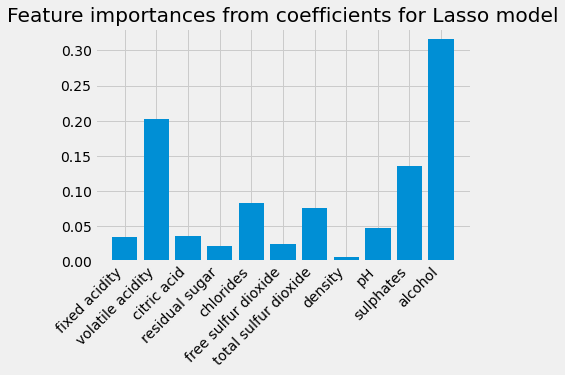

----------------------------------------------------------------------------------------------------
Time spent on Lasso: 0.010 minutes (i.e. 0.6 seconds).
____________________________________________________________________________________________________ 


Testing Ridge with {'alpha': [0.1, 1, 10, 40, 50, 55, 60, 65, 100, 150, 1000]}
Best hyperparameters for Ridge:
{'alpha': 55}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Ridge on train and test:
0.3658 0.3217
----------------------------------------------------------------------------------------------------


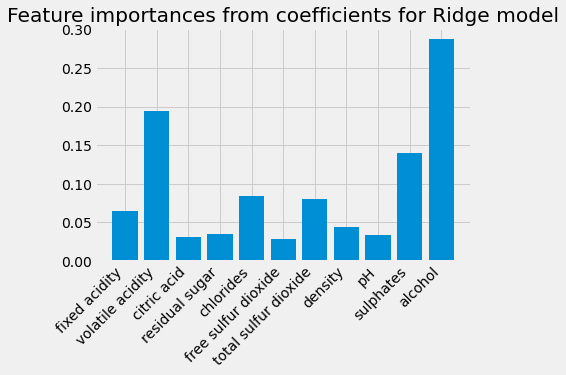

----------------------------------------------------------------------------------------------------
Time spent on Ridge: 0.008 minutes (i.e. 0.5 seconds).
____________________________________________________________________________________________________ 


Testing Elastic Net with {'alpha': [0.001, 0.01, 0.1, 0.5, 1, 10, 40, 50, 55, 60, 65, 100, 150, 1000], 'l1_ratio': [0.001, 0.001, 0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.8]}
Best hyperparameters for Elastic Net:
{'alpha': 0.1, 'l1_ratio': 0.001}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Elastic Net on train and test:
0.3637 0.3222
----------------------------------------------------------------------------------------------------


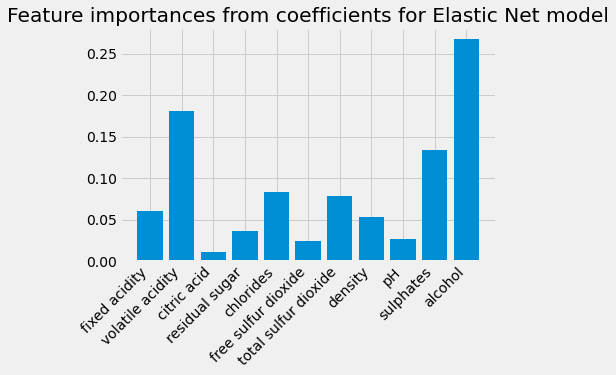

----------------------------------------------------------------------------------------------------
Time spent on Elastic Net: 0.052 minutes (i.e. 3.1 seconds).
____________________________________________________________________________________________________ 


Testing Random Forest Regressor with {'n_estimators': [1, 10, 100, 500, 750, 1000, 1500]}
Best hyperparameters for Random Forest Regressor:
{'n_estimators': 1500}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Random Forest Regressor on train and test:
0.9314 0.5269
----------------------------------------------------------------------------------------------------


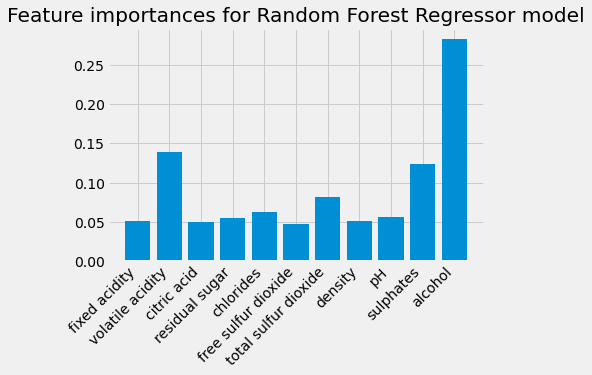

----------------------------------------------------------------------------------------------------
Time spent on Random Forest Regressor: 2.286 minutes (i.e. 137.1 seconds).
____________________________________________________________________________________________________ 


Testing Support Vector Regressor with {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'degree': [1, 2, 3, 4], 'gamma': ['scale', 'auto'], 'C': [0.1, 1, 1.1]}
Best hyperparameters for Support Vector Regressor:
{'C': 1, 'degree': 1, 'gamma': 'auto', 'kernel': 'rbf'}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Support Vector Regressor on train and test:
0.5396 0.406
----------------------------------------------------------------------------------------------------


 ____________________________________________________________________________________________________
Time spent on all models: 3.444 minutes (i.e. 

In [ ]:
# Set hyperparameters grid for lasso regression which we want to check
red_wine_lasso_hyperparam_dict = {
    'alpha': [1e-3, 2e-3, 2.8e-3, 3e-3, 3.1e-3, 4e-3, 5e-3, 0.1, 1, 10, 100, 1000]
}

# Set hyperparameters grid for ridge regression which we want to check
red_wine_ridge_hyperparam_dict = {
    'alpha': [0.1, 1, 10, 40, 50, 55, 60, 65, 100, 150, 1000]
}

# Set hyperparameters grid for elastic net regression which we want to check
red_wine_elastic_net_hyperparam_dict = {
    'alpha': [0.001, 0.01, 0.1, 0.5, 1, 10, 40, 50, 55, 60, 65, 100, 150, 1000],
    'l1_ratio': [1e-3, 0.001, 0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.8]
}

# Set hyperparameters grid for random forest regression which we want to check
red_wine_RFR_hyperparam_dict = {
    'n_estimators': [1, 10, 100, 500, 750, 1000, 1500]  # Number of tress in the random forest
}

# Set hyperparameters grid for support vector regression which we want to check
red_wine_SVR_hyperparam_dict = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [1, 2, 3, 4],
    'gamma': ['scale', 'auto'],
    'C': [0.1, 1, 1.1]
}


# Get the list of dictionaries of the hyperparameter values which we want to check
red_wine_hyperparam_grids_list = [red_wine_lasso_hyperparam_dict, red_wine_ridge_hyperparam_dict, red_wine_elastic_net_hyperparam_dict, 
                                  red_wine_RFR_hyperparam_dict, red_wine_SVR_hyperparam_dict]

# Define dictionary of models that we want to test
red_wine_models_dict = {
    'Lasso': Lasso(),
    'Ridge': Ridge(),
    'Elastic Net': ElasticNet(),
    'Random Forest Regressor': RandomForestRegressor(),
    'Support Vector Regressor': SVR()
}

# Make sure that the sequence of hyperparameter dictionaries in the list and mmodels in the models dictionary matches

# Call the function to test models on red wine data using the hyperparameters grid dictionaries    
test_GridSearchCV_models(models_dict=red_wine_models_dict, hyperparam_grids_list=red_wine_hyperparam_grids_list, 
                         X_train=red_wine_X_train, y_train=red_wine_y_train, X_test=red_wine_X_test, y_test=red_wine_y_test)

Obervations:
1. Most important variable remains same in case of L-1 regularized, L-2 regularized and elastic net linear regression models.
2. However sequence of importance is not the same. For example the least important variables are different for the 3 models.
3. Random forest regression and support vector regressor does not have coefficients. So models were trained (paramter tunned) with the best hyper-parameters obtained using GridsearchCV and then 'feature_importances_' method was used.
4. Optimized alpha hyperparameter for lasso is 0.0031. (It will be used in feature selection using lasso regularization later.)
5. Optimal value of n-estimators in random forest regression is not always the same. (reason unknown)
6. All the R-squared values seems to be moderately low.
7. R-squared value of random forest regressor is higher on training data and lower on testing data. Sp it seems to be overfitting on the training data with the selected 'n_estimators' hyperparameters.

Note:
1. Training is 'parameter tunning' and validation is 'hyper-parameter tunning'.
2. coefficients are parameters.
3. Regularization paramters are hyper-parameters.
4. Magnitude of coefficients of the input variables in the data just gives relative importance of that variable. But whether the variable is statistically important or not can only be checked using p-value (hypothesis testing on the coefficients).

### Testing models on white wine data

Testing Lasso with {'alpha': [0.0001, 0.001, 0.0015, 0.002, 0.0025, 0.01, 0.1, 1, 10, 100, 1000]}
Best hyperparameters for Lasso:
{'alpha': 0.0025}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Lasso on train and test:
0.2852 0.2527
----------------------------------------------------------------------------------------------------


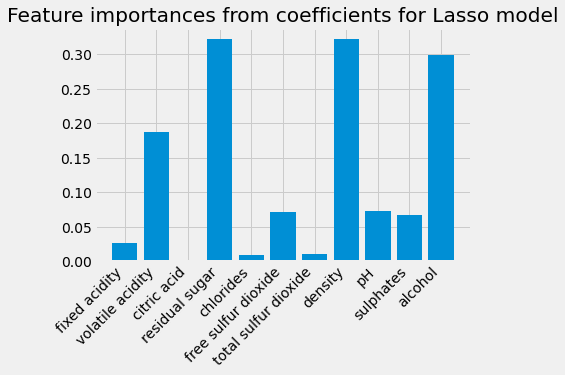

----------------------------------------------------------------------------------------------------
Time spent on Lasso: 0.013 minutes (i.e. 0.8 seconds).
____________________________________________________________________________________________________ 


Testing Ridge with {'alpha': [0.001, 0.1, 1, 10, 100, 150, 1000]}
Best hyperparameters for Ridge:
{'alpha': 10}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Ridge on train and test:
0.2858 0.2536
----------------------------------------------------------------------------------------------------


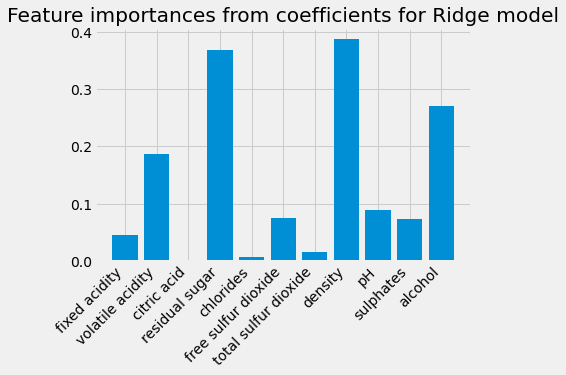

----------------------------------------------------------------------------------------------------
Time spent on Ridge: 0.007 minutes (i.e. 0.4 seconds).
____________________________________________________________________________________________________ 


Testing Elastic Net with {'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'l1_ratio': [0.1, 0.2, 0.3, 0.8]}
Best hyperparameters for Elastic Net:
{'alpha': 0.01, 'l1_ratio': 0.1}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Elastic Net on train and test:
0.285 0.2519
----------------------------------------------------------------------------------------------------


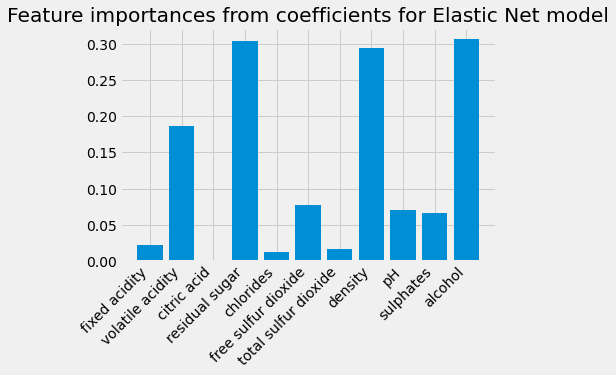

----------------------------------------------------------------------------------------------------
Time spent on Elastic Net: 0.021 minutes (i.e. 1.3 seconds).
____________________________________________________________________________________________________ 


Testing Random Forest Regressor with {'n_estimators': [1, 10, 100, 500, 1000, 1500, 1750, 2000, 2500]}
Best hyperparameters for Random Forest Regressor:
{'n_estimators': 2000}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Random Forest Regressor on train and test:
0.9374 0.533
----------------------------------------------------------------------------------------------------


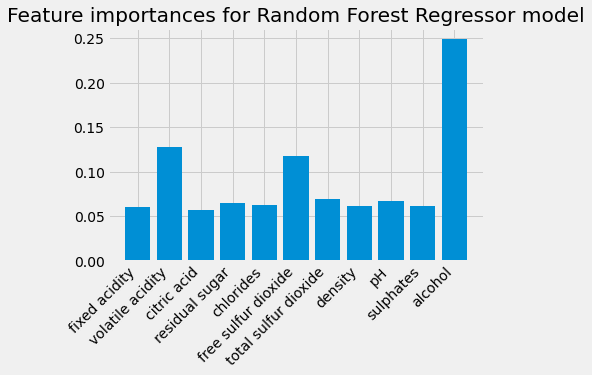

----------------------------------------------------------------------------------------------------
Time spent on Random Forest Regressor: 16.242 minutes (i.e. 974.5 seconds).
____________________________________________________________________________________________________ 


Testing Support Vector Regressor with {'kernel': ['linear', 'poly', 'rbf'], 'degree': [1, 2, 3, 4], 'gamma': ['scale', 'auto'], 'C': [0.1, 1, 1.1, 1.2]}
Best hyperparameters for Support Vector Regressor:
{'C': 1.2, 'degree': 1, 'gamma': 'auto', 'kernel': 'rbf'}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Support Vector Regressor on train and test:
0.5117 0.3624
----------------------------------------------------------------------------------------------------


 ____________________________________________________________________________________________________
Time spent on all models: 27.380 minutes (i.e. 1

In [ ]:
# Set hyperparameters grid for lasso regression which we want to check
white_wine_lasso_hyperparam_dict = {
    'alpha': [1e-4, 1e-3, 1.5e-3, 2e-3, 2.5e-3, 1e-2, 0.1, 1, 10, 100, 1000]
}

# Set hyperparameters grid for ridge regression which we want to check
white_wine_ridge_hyperparam_dict = {
    'alpha': [0.001, 0.1, 1, 10, 100, 150, 1000]
}

# Set hyperparameters grid for elastic net regression which we want to check
white_wine_elastic_net_hyperparam_dict = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'l1_ratio': [0.1, 0.2, 0.3, 0.8] # lies between 0 and 1
}

# Set hyperparameters grid for random forest regression which we want to check
white_wine_RFR_hyperparam_dict = {
    'n_estimators': [1, 10, 100, 500, 1000, 1500, 1750, 2000, 2500]  # Number of tress in the random forest
}

# Set hyperparameters grid for support vector regression which we want to check
white_wine_SVR_hyperparam_dict = {
    'kernel': ['linear', 'poly', 'rbf'],
    'degree': [1, 2, 3, 4],
    'gamma': ['scale', 'auto'],
    'C': [0.1, 1, 1.1, 1.2]
}


# Get the list of dictionaries of the hyperparameter values which we want to check
white_wine_hyperparam_grids_list = [white_wine_lasso_hyperparam_dict, white_wine_ridge_hyperparam_dict, white_wine_elastic_net_hyperparam_dict, 
                         white_wine_RFR_hyperparam_dict, white_wine_SVR_hyperparam_dict]

# Define dictionary of models that we want to test
white_wine_models_dict = {
    'Lasso': Lasso(),
    'Ridge': Ridge(),
    'Elastic Net': ElasticNet(),
    'Random Forest Regressor': RandomForestRegressor(),
    'Support Vector Regressor': SVR()
}

# Call the function to test models on white wine data using the hyperparameters grid dictionaries
test_GridSearchCV_models(models_dict=white_wine_models_dict, hyperparam_grids_list=white_wine_hyperparam_grids_list, 
                         X_train=white_wine_X_train, y_train=white_wine_y_train, X_test=white_wine_X_test, y_test=white_wine_y_test,)
                        #  test_specific_model='Lasso')

### e) Testing models for red wine data on white wine data

Testing Lasso with {'alpha': [0.001, 0.002, 0.0028, 0.003, 0.0031, 0.004, 0.005, 0.1, 1, 10, 100, 1000]}
Best hyperparameters for Lasso:
{'alpha': 0.0031}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Lasso on train and test:
0.3659 0.0913
----------------------------------------------------------------------------------------------------


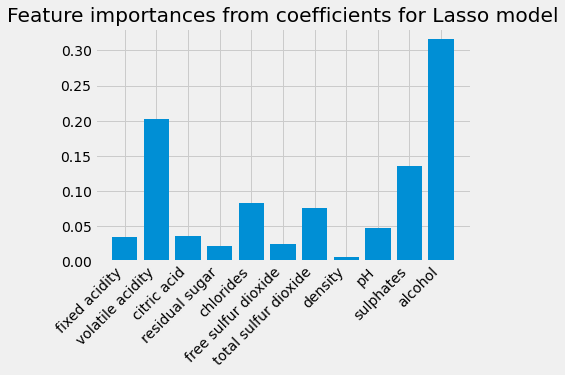

----------------------------------------------------------------------------------------------------
Time spent on Lasso: 0.009 minutes (i.e. 0.5 seconds).
____________________________________________________________________________________________________ 


Testing Ridge with {'alpha': [0.1, 1, 10, 40, 50, 55, 60, 65, 100, 150, 1000]}
Best hyperparameters for Ridge:
{'alpha': 55}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Ridge on train and test:
0.3658 0.085
----------------------------------------------------------------------------------------------------


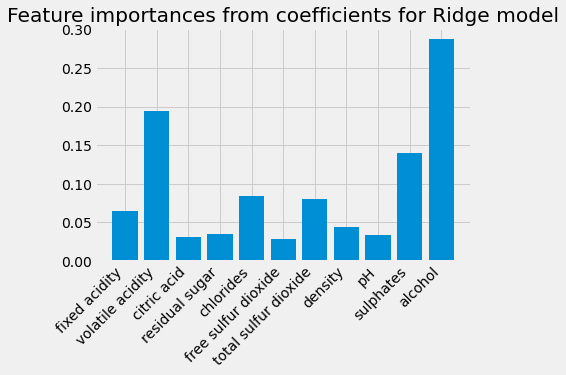

----------------------------------------------------------------------------------------------------
Time spent on Ridge: 0.008 minutes (i.e. 0.5 seconds).
____________________________________________________________________________________________________ 


Testing Elastic Net with {'alpha': [0.001, 0.01, 0.1, 0.5, 1, 10, 40, 50, 55, 60, 65, 100, 150, 1000], 'l1_ratio': [0.001, 0.001, 0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.8]}
Best hyperparameters for Elastic Net:
{'alpha': 0.1, 'l1_ratio': 0.001}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Elastic Net on train and test:
0.3637 0.0867
----------------------------------------------------------------------------------------------------


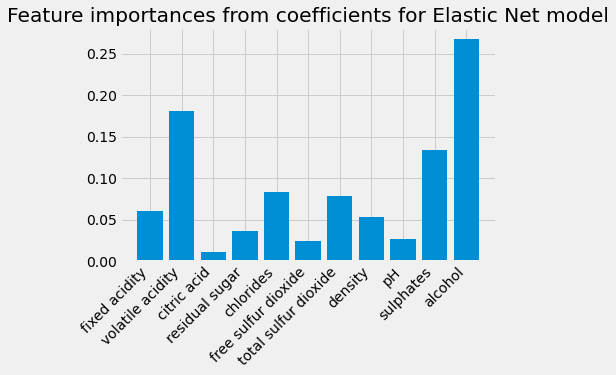

----------------------------------------------------------------------------------------------------
Time spent on Elastic Net: 0.053 minutes (i.e. 3.2 seconds).
____________________________________________________________________________________________________ 


Testing Random Forest Regressor with {'n_estimators': [1, 10, 100, 500, 750, 1000, 1500]}
Best hyperparameters for Random Forest Regressor:
{'n_estimators': 1500}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Random Forest Regressor on train and test:
0.9305 -0.004
----------------------------------------------------------------------------------------------------


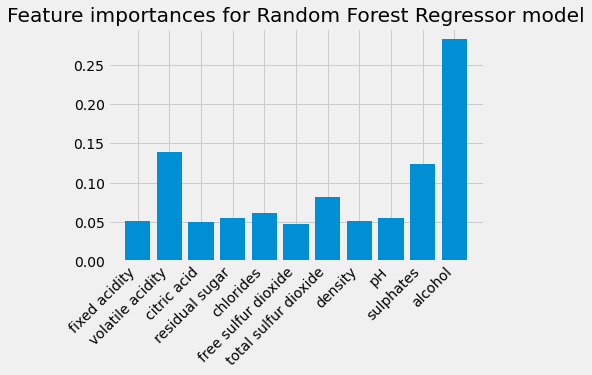

----------------------------------------------------------------------------------------------------
Time spent on Random Forest Regressor: 2.258 minutes (i.e. 135.5 seconds).
____________________________________________________________________________________________________ 


Testing Support Vector Regressor with {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], 'degree': [1, 2, 3, 4], 'gamma': ['scale', 'auto'], 'C': [0.1, 1, 1.1]}
Best hyperparameters for Support Vector Regressor:
{'C': 1, 'degree': 1, 'gamma': 'auto', 'kernel': 'rbf'}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Support Vector Regressor on train and test:
0.5396 -0.1723
----------------------------------------------------------------------------------------------------


 ____________________________________________________________________________________________________
Time spent on all models: 3.414 minutes (i.e

In [ ]:
# Change the testing data to white wine data. Keep the rest of the attributes same as for red wine data
test_GridSearchCV_models(models_dict=red_wine_models_dict, hyperparam_grids_list=red_wine_hyperparam_grids_list, 
                         X_train=red_wine_X_train, y_train=red_wine_y_train, X_test=white_wine_X_test, y_test=white_wine_y_test)

### Testing models for white wine data on red wine data

Testing Lasso with {'alpha': [0.0001, 0.001, 0.0015, 0.002, 0.0025, 0.01, 0.1, 1, 10, 100, 1000]}
Best hyperparameters for Lasso:
{'alpha': 0.0025}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Lasso on train and test:
0.2852 -0.185
----------------------------------------------------------------------------------------------------


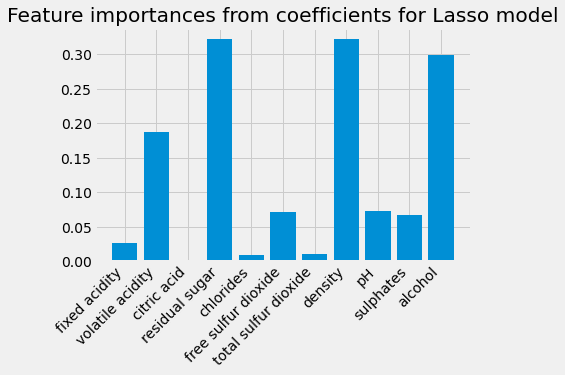

----------------------------------------------------------------------------------------------------
Time spent on Lasso: 0.011 minutes (i.e. 0.7 seconds).
____________________________________________________________________________________________________ 


Testing Ridge with {'alpha': [0.001, 0.1, 1, 10, 100, 150, 1000]}
Best hyperparameters for Ridge:
{'alpha': 10}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Ridge on train and test:
0.2858 -0.2641
----------------------------------------------------------------------------------------------------


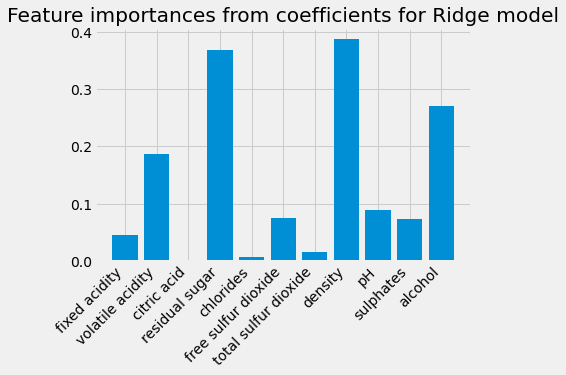

----------------------------------------------------------------------------------------------------
Time spent on Ridge: 0.007 minutes (i.e. 0.4 seconds).
____________________________________________________________________________________________________ 


Testing Elastic Net with {'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000], 'l1_ratio': [0.1, 0.2, 0.3, 0.8]}
Best hyperparameters for Elastic Net:
{'alpha': 0.01, 'l1_ratio': 0.1}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Elastic Net on train and test:
0.285 -0.1489
----------------------------------------------------------------------------------------------------


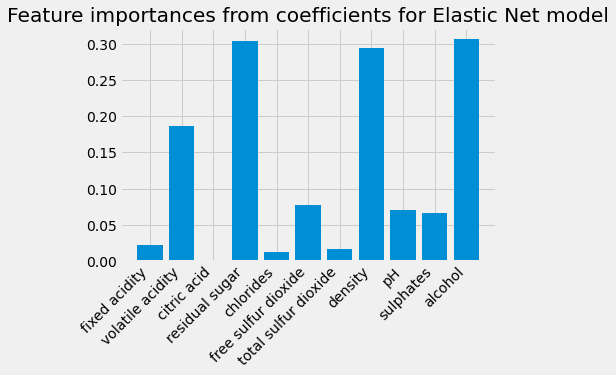

----------------------------------------------------------------------------------------------------
Time spent on Elastic Net: 0.019 minutes (i.e. 1.2 seconds).
____________________________________________________________________________________________________ 


Testing Random Forest Regressor with {'n_estimators': [1, 10, 100, 500, 1000, 1500, 1750, 2000, 2500]}
Best hyperparameters for Random Forest Regressor:
{'n_estimators': 2000}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Random Forest Regressor on train and test:
0.9369 0.1356
----------------------------------------------------------------------------------------------------


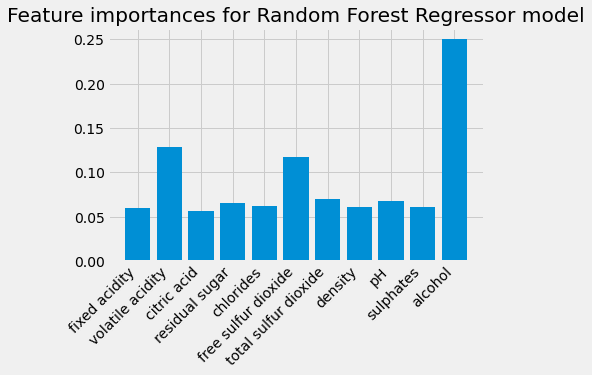

----------------------------------------------------------------------------------------------------
Time spent on Random Forest Regressor: 16.211 minutes (i.e. 972.6 seconds).
____________________________________________________________________________________________________ 


Testing Support Vector Regressor with {'kernel': ['linear', 'poly', 'rbf'], 'degree': [1, 2, 3, 4], 'gamma': ['scale', 'auto'], 'C': [0.1, 1, 1.1, 1.2]}
Best hyperparameters for Support Vector Regressor:
{'C': 1.2, 'degree': 1, 'gamma': 'auto', 'kernel': 'rbf'}
----------------------------------------------------------------------------------------------------
R-squared values rounded till 4 decimals for Support Vector Regressor on train and test:
0.5117 0.0333
----------------------------------------------------------------------------------------------------


 ____________________________________________________________________________________________________
Time spent on all models: 27.402 minutes (i.e. 1

In [ ]:
# Change the testing data to red wine data. Keep the rest of the attributes same as for white wine data
test_GridSearchCV_models(models_dict=white_wine_models_dict, hyperparam_grids_list=white_wine_hyperparam_grids_list, 
                         X_train=white_wine_X_train, y_train=white_wine_y_train, X_test=red_wine_X_test, y_test=red_wine_y_test)

Observations:
1. Testing model for red wine data on white wine data and vice versa, results very low (almost zero) or even negative R-squared values on the testing data.
2. R2  is computed as 1−SSE/SST. (here, SSE = sum of squared errors/residuals and SST is SSE+SSR, where SSR is regression sum of squared )
When SSE is greater than SST, that equation computes a negative value for R2

Useful resource:
1. https://stats.stackexchange.com/questions/12900/when-is-r-squared-negative
2. https://medium.com/analytics-vidhya/is-it-possible-to-have-a-negative-r-square-847a6a4a2fbe#:~:text=R%20square%20can%20have%20a,of%20the%20linear%20regression%20line.

### c) i) Feature selection (elimination) using lasso regularization

Useful resource:
1. https://scikit-learn.org/stable/modules/feature_selection.html


#### Function for lasso feature selector using a range of vlaues of alpha

In [ ]:
# Import the required libraries/functions
from sklearn.feature_selection import SelectFromModel

# Define function for feature selection using lasso for given values of alpha  
def lasso_feature_selector(alpha_list, X_train, y_train):
    for alpha in alpha_list:
        # Print current alpha
        print(f'Feature selector model with alpha = {alpha}')

        # Define the feature selecter
        feature_selecter_model = SelectFromModel(estimator=Lasso(alpha=alpha))

        # Fit the feature selector model
        fitted_feature_selecter_model = feature_selecter_model.fit(X_train, y_train)

        # Get boolean list of features being selected or not
        is_feature_selected_list = fitted_feature_selecter_model.get_support()

        # Get selected features list
        selected_features_list = X_train.columns[is_feature_selected_list]
        print('Selected features: \n', selected_features_list)
        print('--'*50)

        # Get removed features list
        removed_features_list = X_train.columns[[not x for x in is_feature_selected_list]]
        print('Removed features: \n', removed_features_list)
        print('__'*50, '\n')

#### Use the feature selector function on red wine data

In [ ]:
# Set list of alpha hyperparameter values to test
red_wine_alpha_list = [0.0031, 0.1, 1, 10, 100]

# Call function of feature selection using lasso on red wine data
lasso_feature_selector(alpha_list=red_wine_alpha_list, X_train=red_wine_X_train, y_train=red_wine_y_train)

Feature selector model with alpha = 0.0031
Selected features: 
 Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Removed features: 
 Index([], dtype='object')
____________________________________________________________________________________________________ 

Feature selector model with alpha = 0.1
Selected features: 
 Index(['volatile acidity', 'sulphates', 'alcohol'], dtype='object')
----------------------------------------------------------------------------------------------------
Removed features: 
 Index(['fixed acidity', 'citric acid', 'residual sugar', 'chlorides',
       'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH'],
      dtype='object')
_________________________________________________________

Observations:
1. There are no features eliminated for alpha=0.0031 (best in the given range according to gridsearchcv)
2. As alpha increases number of features eliminated inreases.
3. For alpha >=1 all features are eliminated.

#### Use the feature selector function on white wine data

In [ ]:
# Set list of alpha hyperparameter values to test
white_wine_alpha_list = [0.0025, 0.1, 1, 10, 100]

# Call function of feature selection using lasso on white wine data
lasso_feature_selector(alpha_list=white_wine_alpha_list, X_train=white_wine_X_train, y_train=white_wine_y_train)

Feature selector model with alpha = 0.0025
Selected features: 
 Index(['fixed acidity', 'volatile acidity', 'residual sugar', 'chlorides',
       'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH',
       'sulphates', 'alcohol'],
      dtype='object')
----------------------------------------------------------------------------------------------------
Removed features: 
 Index(['citric acid'], dtype='object')
____________________________________________________________________________________________________ 

Feature selector model with alpha = 0.1
Selected features: 
 Index(['volatile acidity', 'alcohol'], dtype='object')
----------------------------------------------------------------------------------------------------
Removed features: 
 Index(['fixed acidity', 'citric acid', 'residual sugar', 'chlorides',
       'free sulfur dioxide', 'total sulfur dioxide', 'density', 'pH',
       'sulphates'],
      dtype='object')
____________________________________________________

Observations:
1. 'citric acid' feature is eliminated for alpha=0.0025 (best in the given range according to gridsearchcv)
2. As alpha increases number of features eliminated inreases.
3. For alpha >=1 all features are eliminated.

# Credits

1. [EE 769: Module 1.2.2 - ML for Smart Monkeys](https://youtu.be/Ato-hcv0NK0?list=PLZKhx5nBXhfhL28m4mjIM5kSwh5gUV2k6)

2. Dataset source: Paulo Cortez, University of Minho, Guimarães, Portugal, http://www3.dsi.uminho.pt/pcortez

3. Dataset citation: P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis.
Modeling wine preferences by data mining from physicochemical properties. In Decision Support Systems, Elsevier, 47(4):547-553, 2009.

4. Dataset downloaded from: https://archive.ics.uci.edu/ml/datasets/Wine+Quality

3. [Scikit-learn: Machine Learning in Python, Pedregosa et al., JMLR 12, pp. 2825-2830, 2011.](https://jmlr.csail.mit.edu/papers/v12/pedregosa11a.html)

# Notes

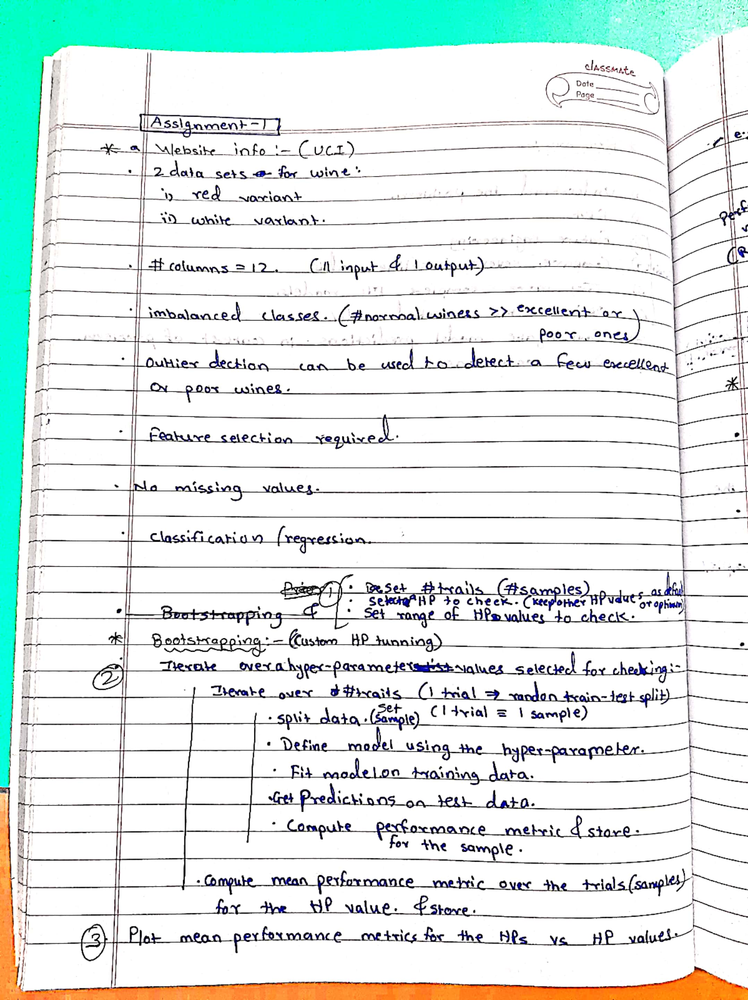

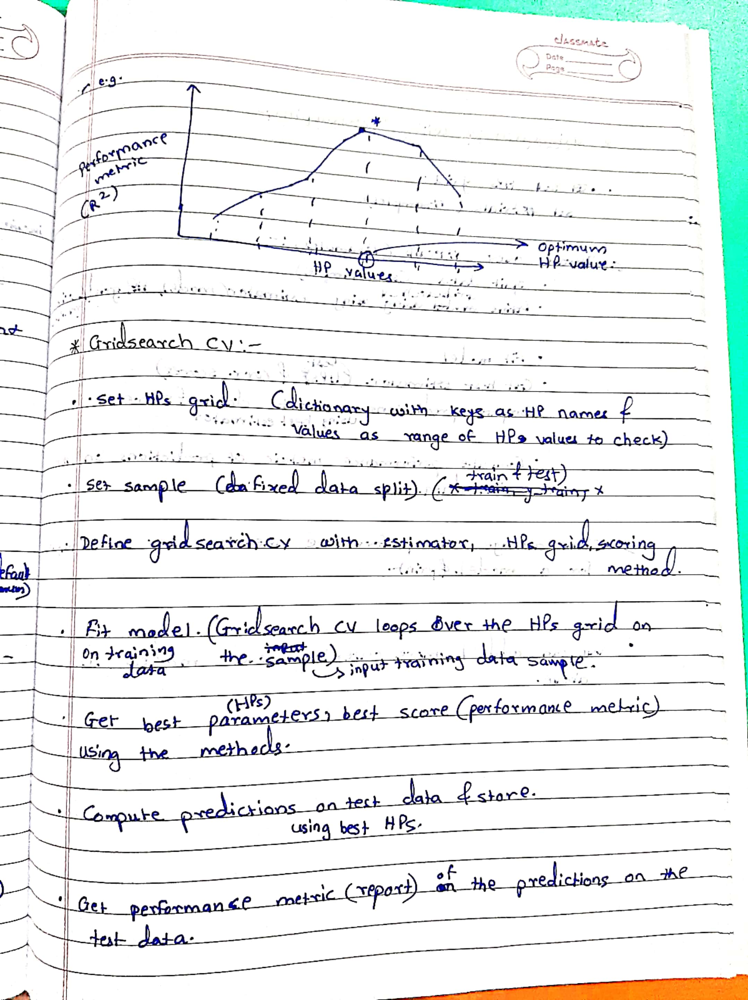

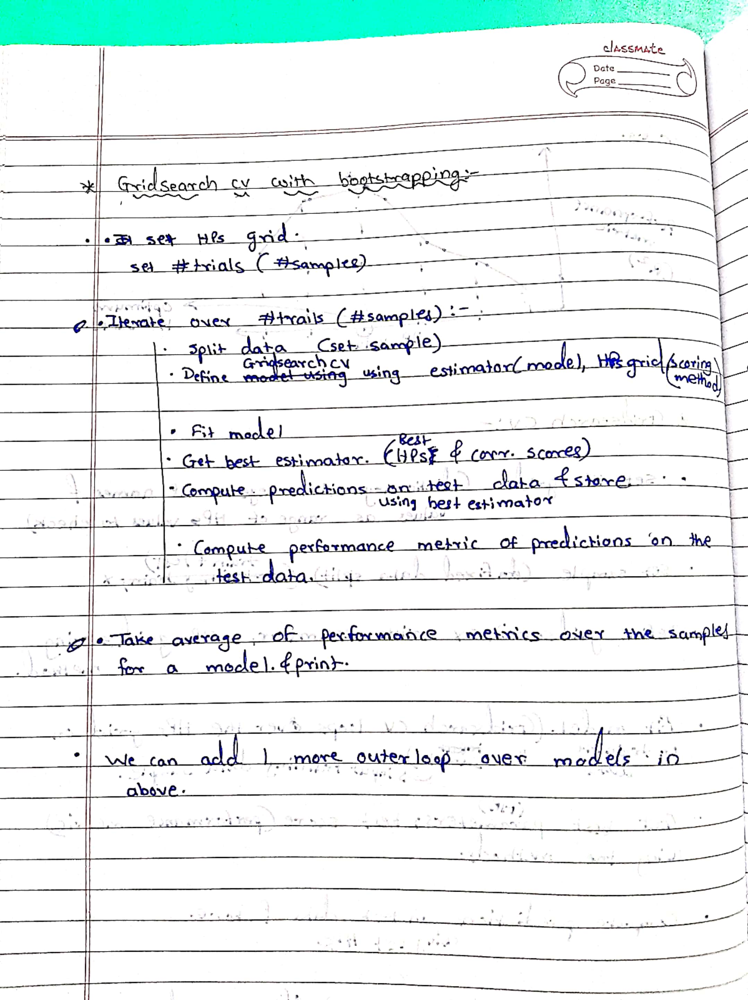

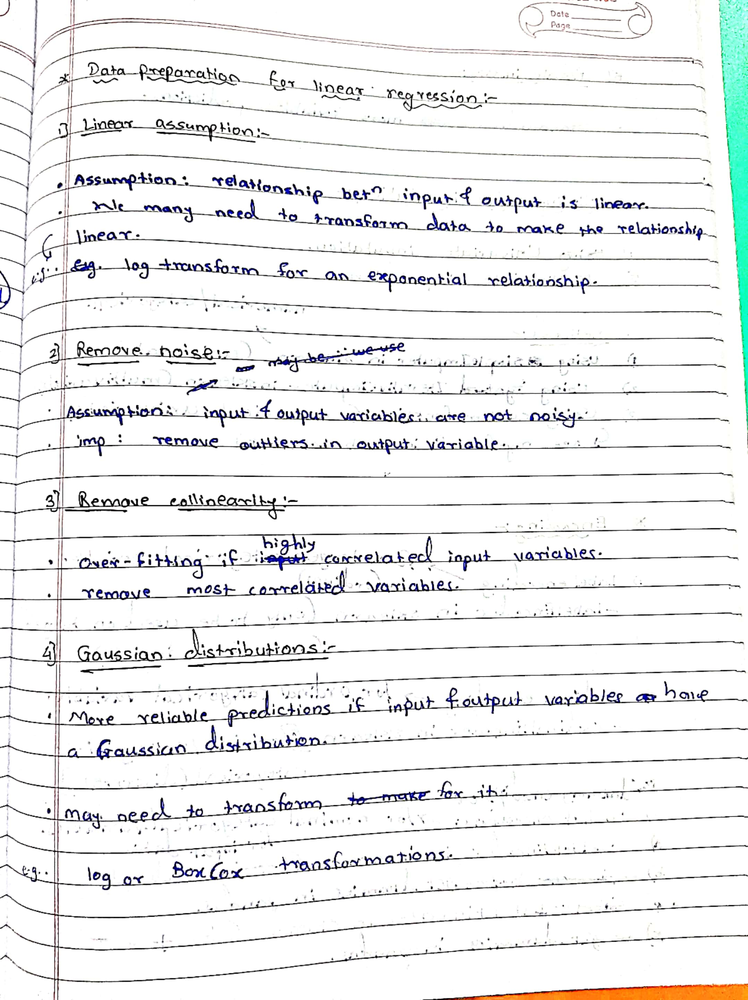

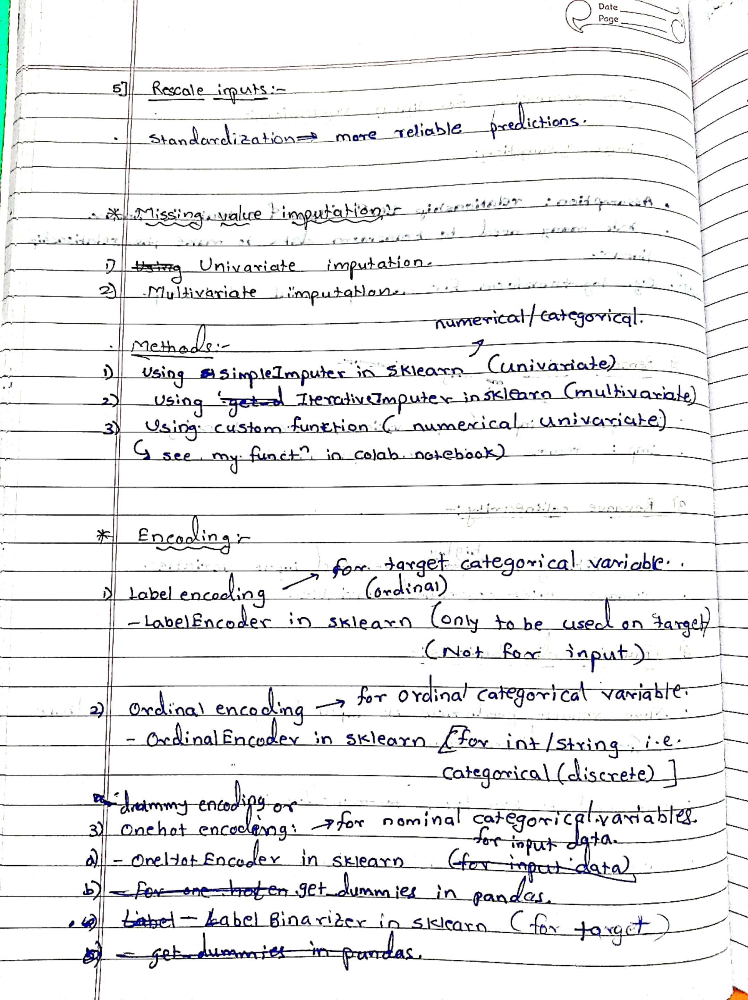